# WA: Fit new models at lower rank with selected trasient and sustained waveforms
## Consider using thresholded instead of weighted TCA cell factors

In [52]:
%load_ext autoreload
%autoreload 2
import cascade as cas
import flow
import pool
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
from copy import deepcopy
import scipy as sp
import bottleneck as bt

# except: 
import tensortools as tt
from flow.misc import wordhash
from cascade import utils
from cascade import paths
from cascade import tca
from functools import reduce

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
# useful lookup tables
color_dict = {'plus': [0.46, 0.85, 0.47, 1],
     'minus': [0.84, 0.12, 0.13, 1],
     'neutral': [0.28, 0.68, 0.93, 1],
     'learning': [34/255, 110/255, 54/255, 1],
     'reversal': [173/255, 38/255, 26/255, 1],
     'gray': [163/255, 163/255, 163/255, 1]}

lookup = {'OA27': {'plus': 270, 'minus': 135, 'neutral': 0},
     'VF226': {'plus': 0, 'minus': 270, 'neutral': 135},
     'OA67': {'plus': 0, 'minus': 270, 'neutral': 135},
     'OA32': {'plus': 135, 'minus': 0, 'neutral': 270},
     'OA34': {'plus': 270, 'minus': 135, 'neutral': 0},
     'OA36': {'plus': 0, 'minus': 270, 'neutral': 135},
     'OA26': {'plus': 270, 'minus': 135, 'neutral': 0}}

lookup_ori = {'OA27': {270: 'plus', 135: 'minus', 0: 'neutral'},
     'VF226': {0: 'plus', 270: 'minus', 135: 'neutral'},
     'OA67': {0: 'plus', 270: 'minus', 135: 'neutral'},
     'OA32': {135: 'plus', 0: 'minus', 270: 'neutral'},
     'OA34': {270: 'plus', 135: 'minus', 0: 'neutral'},
     'OA36': {0: 'plus', 270: 'minus', 135: 'neutral'},
     'OA26': {270: 'plus', 135: 'minus', 0: 'neutral'}}

In [6]:
def _first100_bool(meta):
    """
    Helper function to get a boolean vector of the first 100 trials for each day.
    If a day is shorter than 100 trials use the whole day. 
    """
    
    days = meta.reset_index()['date'].unique()

    first100 = np.zeros((len(meta)))
    for di in days:
        dboo  = meta.reset_index()['date'].isin([di]).values
        daylength = np.sum(dboo)
        if daylength > 100:
            first100[np.where(dboo)[0][:100]] = 1
        else:
            first100[dboo] = 1
    firstboo = first100 > 0
    
    return firstboo

In [7]:
def _last100_bool(meta):
    """
    Helper function to get a boolean vector of the last 100 trials for each day.
    If a day is shorter than 100 trials use the whole day. 
    """
    
    days = meta.reset_index()['date'].unique()

    first100 = np.zeros((len(meta)))
    for di in days:
        dboo  = meta.reset_index()['date'].isin([di]).values
        daylength = np.sum(dboo)
        if daylength > 100:
            first100[np.where(dboo)[0][-100:]] = 1
        else:
            first100[dboo] = 1
    firstboo = first100 > 0
    
    return firstboo

In [8]:
def _firstlast100_bool(meta):
    """
    Helper function to get a boolean vector of the first and last 100 trials for each day.
    If a day is shorter than 200 trials use the whole day. 
    """
    
    days = meta.reset_index()['date'].unique()

    first100 = np.zeros((len(meta)))
    for di in days:
        dboo  = meta.reset_index()['date'].isin([di]).values
        daylength = np.sum(dboo)
        if daylength > 100:
            first100[np.where(dboo)[0][-50:]] = 1
            first100[np.where(dboo)[0][:50]] = 1
        else:
            first100[dboo] = 1
    firstboo = first100 > 0
    
    return firstboo

In [9]:
def _mosttrials_bool(meta):
    """
    Helper function to get a boolean vector of the first n trials for each day.
    n = the number of trials on the shortest day.
    """
    
    day_lengths = []
    days = meta.reset_index()['date'].unique()
    for di in days:
        dboo  = meta.reset_index()['date'].isin([di]).values
        day_lengths.append(np.sum(dboo))
    trialn = np.min(day_lengths)
    
    first100 = np.zeros((len(meta)))
    for di in days:
        dboo  = meta.reset_index()['date'].isin([di]).values
        first100[np.where(dboo)[0][:trialn]] = 1
    firstboo = first100 > 0
    
    mouse = meta.reset_index()['mouse'].unique()[0]
    print('{}: {} trials are being used to maximize possible trials each day'.format(mouse, trialn))
    
    return firstboo

In [10]:
def _mostlatetrials_bool(meta):
    """
    Helper function to get a boolean vector of the first n trials for each day.
    n = the number of trials on the shortest day.
    """
    
    day_lengths = []
    days = meta.reset_index()['date'].unique()
    for di in days:
        dboo  = meta.reset_index()['date'].isin([di]).values
        day_lengths.append(np.sum(dboo))
    trialn = np.min(day_lengths)
    
    first100 = np.zeros((len(meta)))
    for di in days:
        dboo  = meta.reset_index()['date'].isin([di]).values
        first100[np.where(dboo)[0][-trialn:]] = 1
    firstboo = first100 > 0
    
    mouse = meta.reset_index()['mouse'].unique()[0]
    print('{}: {} trials are being used to maximize possible trials each day'.format(mouse, trialn))
    
    return firstboo

In [11]:
def _get_fitting_template_defaults(mouse, sigma=3, sec=15.5, normalize=True):
    """
    Helper function for convolving Gaussian kernel with onset, sustained 
    stimulus, stimulus offset, and ensure delivery period. These can then be
    used for simple linear regression or GLM. 
    """

    # preallocate Gaussian kernel convolution 
    gker = []
    
    # dumb params
    blur = sec
    lag = sec/2
    elag = sec/1.5
    # pick ranges of relevant time periods for convolution
    onset_r = np.arange(np.floor(sec + lag), np.round(sec + sec/3 + blur), 1)
    if mouse in ['OA32', 'OA34', 'OA36']:
        sus_r = np.arange(np.floor(sec + lag), np.round(sec*3 + blur), 1)
        off_r = np.arange(np.floor(sec*3 + sec/4 + lag), np.round(sec*3 + sec/3 + blur), 1)
        ensure_r = np.arange(np.floor(sec*3 + sec/3 + elag), np.round(sec*5 + blur), 1)
    else:
        sus_r = np.arange(np.floor(sec + lag), np.round(sec*4 + blur), 1)
        off_r = np.arange(np.floor(sec*4 + sec/4 + lag), np.round(sec*4 + sec/3 + blur), 1)
        ensure_r = np.arange(np.floor(sec*4 + sec/3 + elag), np.round(sec*6 + blur), 1)
    ranges = [onset_r, sus_r, off_r, ensure_r]

    # convolve
    for i in ranges:
        i = [int(s) for s in i]
        starter = np.zeros((108))
        starter[i] = 1
        gker.append(sp.ndimage.gaussian_filter1d(starter, sigma, mode='constant', cval=0))

    # normalize filters
    if normalize:
        gker = [(s - np.min(s))/np.max(s) for s in gker]

    templates = np.vstack(gker).T

    return templates

In [94]:
def _sortcellfactors(cell_factors):
    """
    Sort a set of neuron factors by which factor they contribute
    to the most.

    Input
    -------
    Tensortools ensemble with method. (set of multiple initializations of TCA)
        i.e., _sortfactors(ensemble['ncp_bcd'])

    Returns
    -------
    my_method, copy of tensortools ensemble method now with neuron factors sorted.
    my_rank_sorts, sort indexes to keep track of cell identity

    """

    factors = deepcopy(cell_factors)

    # sort each neuron factor and update the order based on strongest factor
    # reflecting prioritized sorting of earliest to latest factors

    # sort neuron factors according to which component had highest weight
    max_fac = np.argmax(factors, axis=1)
    sort_fac = np.argsort(max_fac)
    sort_max_fac = max_fac[sort_fac]
    first_sort = factors[sort_fac, :]

    # descending sort within each group of sorted neurons
    second_sort = []
    for i in np.unique(max_fac):
        second_inds = (np.where(sort_max_fac == i)[0])
        second_sub_sort = np.argsort(first_sort[sort_max_fac == i, i])
        second_sort.extend(second_inds[second_sub_sort][::-1])

    # apply the second sort
    full_sort = sort_fac[second_sort]
    sorted_factors = factors[full_sort, :]

    # check for zero-weight factors
    no_weight_binary = np.max(sorted_factors, axis=1) == 0
    inds_to_end = full_sort[no_weight_binary]
    full_sort = np.concatenate((full_sort[np.invert(no_weight_binary)], inds_to_end), axis=0)
    
    # apply the final sort
    sorted_factors = factors[full_sort, :]

    return sorted_factors, full_sort

In [53]:
mice = ['OA27', 'VF226', 'OA67','OA32', 'OA34', 'OA36', 'OA26']
words = ['rebel']*len(mice) #viewers
pars = {
    'tags': None,

    # TCA params
    'rank': 20,
    'method': ('ncp_hals',),
    'replicates': 3,
    'fit_options': None,
    'skip_modes': [],
    'negative_modes' :  [],


    # grouping params
    'group_by': 'all2',
    'up_or_down': 'up',
    'use_dprime': False,
    'dprime_threshold': 2,

    # tensor params
    'trace_type': 'zscore_day',
    'cs': '',
    'downsample': True,
    'start_time': -1,
    'end_time': 6,
    'clean_artifacts': None,
    'thresh': 20,
    'warp': False,
    'smooth': True,
    'smooth_win': 6,
    'verbose': True,

    # filtering params
    'exclude_tags': ('disengaged', 'orientation_mapping', 'contrast', 'retinotopy', 'sated'),
    'exclude_conds': ('blank', 'blank_reward', 'pavlovian'),
    'driven': False,
    'drive_css': ('0', '135', '270'),
    'drive_threshold': 1.31, # should change this to 1.31
    'nan_trial_threshold': 0.95,
    'score_threshold': 0.8,

    # other params
    'update_meta': False,
    'three_pt_tf': False,
    'remove_stim_corr': False}

In [13]:
mice = ['OA27', 'VF226', 'OA67','OA32', 'OA34', 'OA36', 'OA26']
words = ['prints']
words.extend(['horrible']*6)

# load in a full size tensor
model_list = []
tensor_list = []
id_list = []
bhv_list = []
meta_list = []
for mouse, word in zip(mice, words):
    out = cas.load.load_all_groupday(mouse, word=word, with_model=False, nan_thresh=0.95)  # return   model, ids, tensor, meta, bhv
    model_list.append(out[0])
    tensor_list.append(out[2])
    id_list.append(out[1])
    bhv_list.append(out[4])
    meta_list.append(out[3])

Updated naive cs-ori pairings to match learning.
     270 plus
     135 minus
     0 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     0 plus
     270 minus
     135 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     0 plus
     270 minus
     135 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     135 plus
     0 minus
     270 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     270 plus
     135 minus
     0 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     0 plus
     270 minus
     135 neutral
Updated naive trialerror to match learning.
Updated naive cs-ori pairings to match learning.
     270 plus
     135 minus
     0 neutral
Updated naive trialerror to match learning.


In [1]:
model_list

NameError: name 'model_list' is not defined

In [159]:
# load TCA models and data

rank = 10
words = ['christina']*len(mice)
model_list = []
model_id_list = []
for mouse, word in zip(mice, words):
    V, my_sorts = cas.load.groupday_tca_model(
            mouse=mouse,
            trace_type='zscore_day',
            method='ncp_hals',
            cs='',
            rank=rank,
            word=word,
            group_by='l_vs_r1_tight',
            nan_thresh=0.95,
            score_threshold=0.8,
            full_output=False,
            unsorted=True,
            verbose=False)
    model_list.append(V)
    ids = cas.load.groupday_tca_ids(
            mouse=mouse,
            trace_type='zscore_day',
            method='ncp_hals',
            cs='',
            word=word,
            group_by='l_vs_r1_tight',
            nan_thresh=0.95,
            score_threshold=0.8)
    model_id_list.append(ids)

In [160]:
# subset full size tensor to only include cells that were kept in tca model
subset_tensor_list = []
subset_model_list = []
for t1, m1, l1, l2 in zip(tensor_list, model_list, id_list, model_id_list):
    survivor_boo = np.in1d(l1, l2)
    subset_tensor_list.append(t1[survivor_boo,:,:])
    kept_ids1 = l1[survivor_boo]
    survivor_boo = np.in1d(l2, l1)
    subset_model_list.append(m1.results[rank][0].factors[0][survivor_boo, :])
    kept_ids2 = l2[survivor_boo]
    if np.sum((kept_ids1-kept_ids2) != 0) > 0:
        print('Unmatched ids!!!')

In [151]:
 ks_mat = cas.calc.tca._trial_driven_visually_bins(subset_tensor_list[0][:,:,:100], 'OA27')

s:\twophoton_analysis\code\cascade\cascade\calc\tca.py:438: RuntimeWarning: Mean of empty slice
  meanbl = np.nanmean(baselines, axis=1)


In [ ]:
# build cell-weighted/-projected, removing trials that are not driven from the weighted/threshed 
# averages
pre_projection_list = []
pre_thresh_list = []
for c, V in enumerate(subset_model_list):
    mi = mice[c]
    map_by_comp = {}
    map_by_comp2 = {}
    ks_mat = cas.calc.tca._trial_driven_visually_bins(subset_tensor_list[c], mi)
    for ci in range(1,rank+1):
        weight_vec = V[:, ci-1]
        thresh = np.std(V)*1
        thresh_vec = deepcopy(V[:, ci-1])
        thresh_vec[thresh_vec <= thresh] = 0
        thresh_vec[thresh_vec > thresh] = 1
        weight_map = np.zeros(subset_tensor_list[c].shape[1:])
        thresh_map = np.zeros(subset_tensor_list[c].shape[1:])
        for tri in range(subset_tensor_list[c].shape[2]):
            trial_sub = deepcopy(subset_tensor_list[c][:,:,tri])
            trial_sub[ks_mat[:, tri] > 1.31, :] = np.nan
            trialx = weight_vec[:, None] * trial_sub
            weight_map[:, tri] = bt.nanmean(trialx, axis=0)
            trialz = thresh_vec[:, None] * trial_sub
            thresh_map[:, tri] = bt.nanmean(trialz, axis=0)
        map_by_comp[ci] = weight_map
        map_by_comp2[ci] = thresh_map
    pre_projection_list.append(map_by_comp)
    pre_thresh_list.append(map_by_comp2)
    print('v1: Done mouse {}.'.format(c+1))

In [ ]:
pre_projection_list

In [ ]:
pre_projection_list

In [166]:
# build cell-weighted/-projected
projection_list = []
for c, V in enumerate(subset_model_list):
    map_by_comp = {}
    for ci in range(1,rank+1):
        weight_vec = V[:, ci-1]
        weight_map = np.zeros(subset_tensor_list[c].shape[1:])
        for tri in range(subset_tensor_list[c].shape[2]):
            trialx = weight_vec[:, None] * subset_tensor_list[c][:,:,tri]
            weight_map[:, tri] = bt.nanmean(trialx, axis=0)
        map_by_comp[ci] = weight_map
    projection_list.append(map_by_comp)
    print('v1: Done mouse {}.'.format(c+1))
    
# build cell-weighted/-projected
thresh_list = []
for c, V in enumerate(subset_model_list):
    map_by_comp = {}
    for ci in range(1,rank+1):
        thresh = np.std(V)*1
        weight_vec = deepcopy(V[:, ci-1])
        weight_vec[weight_vec <= thresh] = 0
        weight_vec[weight_vec > thresh] = 1
        print('    included {} cells from comp {}'.format(np.sum(weight_vec), ci))
        weight_map = np.zeros(subset_tensor_list[c].shape[1:])
        for tri in range(subset_tensor_list[c].shape[2]):
            trialx = weight_vec[:, None] * subset_tensor_list[c][:,:,tri]
            weight_map[:, tri] = bt.nanmean(trialx, axis=0)
        map_by_comp[ci] = weight_map
    thresh_list.append(map_by_comp)
    print('v2: Done mouse {}.'.format(c+1))

v1: Done mouse 1.
v1: Done mouse 2.
v1: Done mouse 3.
v1: Done mouse 4.
v1: Done mouse 5.
v1: Done mouse 6.
v1: Done mouse 7.
    included 17.0 cells from comp 1
    included 34.0 cells from comp 2
    included 35.0 cells from comp 3
    included 29.0 cells from comp 4
    included 51.0 cells from comp 5
    included 14.0 cells from comp 6
    included 28.0 cells from comp 7
    included 18.0 cells from comp 8
    included 21.0 cells from comp 9
    included 29.0 cells from comp 10
v2: Done mouse 1.
    included 3.0 cells from comp 1
    included 12.0 cells from comp 2
    included 5.0 cells from comp 3
    included 8.0 cells from comp 4
    included 7.0 cells from comp 5
    included 32.0 cells from comp 6
    included 3.0 cells from comp 7
    included 4.0 cells from comp 8
    included 9.0 cells from comp 9
    included 3.0 cells from comp 10
v2: Done mouse 2.
    included 23.0 cells from comp 1
    included 23.0 cells from comp 2
    included 11.0 cells from comp 3
    included 20.

In [161]:
# get groups of cells from your components    
# build cell-weighted/-projected
thresh_norep_list = []
for c, V in enumerate(subset_model_list):
    print('Starting: mouse {}.'.format(c+1))
    map_by_comp = {}
    thresh = np.std(V)*1
    sorted_cells = _sortcellfactors(V)
    weights = deepcopy(sorted_cells[0])
    clusters = np.array(np.argmax(weights, axis=1), dtype='float') #vector of cluster residence
    
    # if you have no weights in any component set to nan
    no_weights_bool = np.nansum(weights, axis=1) == 0
    clusters[no_weights_bool] = np.nan
    for i in range(V.shape[1]):
        cell_bool = (weights[:,i] > thresh) & np.isin(clusters, i)
        print('    included {} cells from comp {}'.format(np.sum(cell_bool), i+1))
        map_by_comp[i+1] = bt.nanmean(subset_tensor_list[c][sorted_cells[1], :][cell_bool,:,:], axis=0)
    thresh_norep_list.append(map_by_comp)
    print('Onward: Done mouse {}.\n'.format(c+1))

Starting: mouse 1.
    included 12 cells from comp 1
    included 20 cells from comp 2
    included 26 cells from comp 3
    included 23 cells from comp 4
    included 35 cells from comp 5
    included 9 cells from comp 6
    included 17 cells from comp 7
    included 11 cells from comp 8
    included 9 cells from comp 9
    included 20 cells from comp 10
Onward: Done mouse 1.

Starting: mouse 2.
    included 3 cells from comp 1
    included 10 cells from comp 2
    included 5 cells from comp 3
    included 6 cells from comp 4
    included 4 cells from comp 5
    included 25 cells from comp 6
    included 1 cells from comp 7
    included 3 cells from comp 8
    included 6 cells from comp 9
    included 2 cells from comp 10
Onward: Done mouse 2.

Starting: mouse 3.
    included 18 cells from comp 1
    included 13 cells from comp 2
    included 6 cells from comp 3
    included 9 cells from comp 4
    included 11 cells from comp 5
    included 8 cells from comp 6
    included 7 cells fro

# Simple drivenness metric

In [162]:
# Look at a bin over the first second and one over the remainder of the stim period.
# Since we will exclude offest responses ignore this time period for now.
times = np.arange(-1, 6, 1/15.5)[:-1]
baseboo = times < 0

simp_comp_proj_list = []
for mouse, proj, meti in zip(mice, thresh_norep_list, meta_list):
    print('Started: {}.'.format(mouse))
    
    # get boolean for bins of stimulus period
    if mouse in ['OA32', 'OA34', 'OA36']:
        stim_total = 2
    else: 
        stim_total = 3
    onsetboo = (times > 0) & (times < 0.5)
    sustainboo = (times > 0.5) & (times < stim_total)
    
    comp_list = []
    std_list, on_list, sus_list = [], [], []
    for k in proj:
        ons_resp = np.nanmean(proj[k][onsetboo, :], axis=0)
        sus_resp = np.nanmean(proj[k][sustainboo, :], axis=0)
        base_std = np.nanstd(proj[k][baseboo, :])
        comp_list.append(((ons_resp > base_std) | (sus_resp > base_std))[None, :])
    boomat = np.concatenate(comp_list, axis=0)
    
    simp_comp_proj_list.append(boomat)
    print('    Trials above thresh, of {}: {}'.format(boomat.shape[1], np.sum(boomat, axis=1)/boomat.shape[1]))
    print('Making progress: {} done.\n'.format(mouse))
simp_comp_proj_dict = {}
for mi, pp in zip(mice, simp_comp_proj_list):
    simp_comp_proj_dict[mi] = pp
# np.save('simo_proj_dict_rebel.npy', simp_comp_proj_dict)

Started: OA27.


D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


    Trials above thresh, of 8163: [0.17187309 0.84417494 0.55849565 0.64939361 0.38441749 0.35795663
 0.16636041 0.59720691 0.53325983 0.43954429]
Making progress: OA27 done.

Started: VF226.
    Trials above thresh, of 12813: [0.11660033 0.75259502 0.10996644 0.45469445 0.30227113 0.27550144
 0.37922423 0.35783969 0.44033404 0.31912901]
Making progress: VF226 done.

Started: OA67.
    Trials above thresh, of 7438: [0.30814735 0.53307341 0.37308416 0.53562786 0.95751546 0.71591826
 0.77695617 0.43344985 0.37765528 0.701936  ]
Making progress: OA67 done.

Started: OA32.
    Trials above thresh, of 10993: [0.61675612 0.74183571 0.58109706 0.55735468 0.64686619 0.47166379
 0.29564268 0.53088329 0.73119258 0.87182753]
Making progress: OA32 done.

Started: OA34.
    Trials above thresh, of 10838: [0.46253921 0.07575198 0.46742942 0.55914375 0.69247094 0.08940764
 0.78575383 0.87829858 0.57187673 0.4522052 ]
Making progress: OA34 done.

Started: OA36.
    Trials above thresh, of 5166: [0.650

array([4659, 2680, 4901, 3587, 7291, 2732, 3982,  857, 2555, 4363])

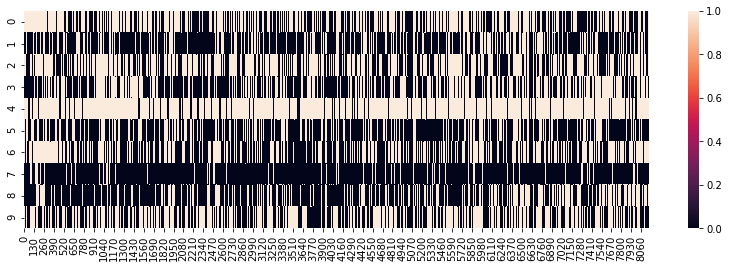

In [163]:
plt.figure(figsize=(14, 4))
sns.heatmap(pseudoten)
np.sum(pseudoten, axis=1)

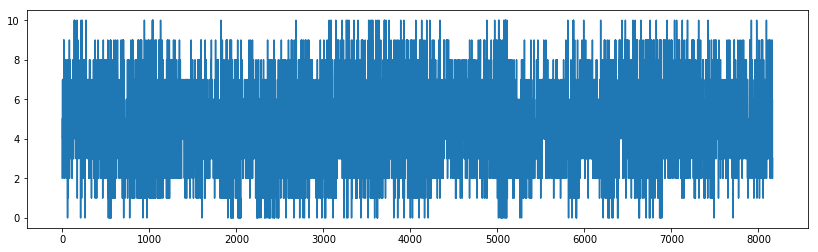

In [133]:
plt.figure(figsize=(14, 4))
plt.plot(np.sum(pseudoten, axis=0))
# np.sum(pseudoten, axis=1)

# complicated drivenness metrics

In [18]:
# for meta, ks, tensor, mouse in zip(my_meta_list, my_ks_list, my_tensor_list, mice):
#     ks_mat = _trial_driven_visually(tensor, mouse, sec=15.5)
comp_proj_ks_list = []
for mouse, proj, meti in zip(mice, projection_list, meta_list):
    comp_list = []
    for k in proj:
        comp_list.append(proj[k][None, :, :])
    pseudoten = np.concatenate(comp_list, axis=0)
#     ks_mat = cas.calc.tca._trial_driven_visually(pseudoten, mouse, sec=15.5)
    ks_mat = cas.calc.tca._trial_driven_visually_bins(pseudoten, mouse, sec=15.5)
    comp_proj_ks_list.append(ks_mat)
    print('Making progress: {} done.'.format(mouse))
comp_proj_ks_dict = {}
for mi, pp in zip(mice, comp_proj_ks_list):
    comp_proj_ks_dict[mi] = pp
np.save('comp_proj_ks_dict_rebel.npy', comp_proj_ks_dict)

(108, 8163)

In [ ]:
# for meta, ks, tensor, mouse in zip(my_meta_list, my_ks_list, my_tensor_list, mice):
#     ks_mat = _trial_driven_visually(tensor, mouse, sec=15.5)
comp_proj_ks_list = []
for mouse, proj, meti in zip(mice, projection_list, meta_list):
    comp_list = []
    for k in proj:
        comp_list.append(proj[k][None, :, :])
    pseudoten = np.concatenate(comp_list, axis=0)
#     ks_mat = cas.calc.tca._trial_driven_visually(pseudoten, mouse, sec=15.5)
    ks_mat = cas.calc.tca._trial_driven_visually_bins(pseudoten, mouse, sec=15.5)
    comp_proj_ks_list.append(ks_mat)
    print('Making progress: {} done.'.format(mouse))
comp_proj_ks_dict = {}
for mi, pp in zip(mice, comp_proj_ks_list):
    comp_proj_ks_dict[mi] = pp
np.save('comp_proj_ks_dict_rebel.npy', comp_proj_ks_dict)

In [ ]:
# for meta, ks, tensor, mouse in zip(my_meta_list, my_ks_list, my_tensor_list, mice):
#     ks_mat = _trial_driven_visually(tensor, mouse, sec=15.5)
comp_proj_ks_list2 = []
for mouse, proj, meti in zip(mice, thresh_list, meta_list):
    comp_list = []
    for k in proj:
        comp_list.append(proj[k][None, :, :])
    pseudoten = np.concatenate(comp_list, axis=0)
#     ks_mat = cas.calc.tca._trial_driven_visually(pseudoten, mouse, sec=15.5)
    ks_mat = cas.calc.tca._trial_driven_visually_bins(pseudoten, mouse, sec=15.5)
    comp_proj_ks_list2.append(ks_mat)
    print('Making progress: {} done.'.format(mouse))
comp_proj_ks_dict2 = {}
for mi, pp in zip(mice, comp_proj_ks_list2):
    comp_proj_ks_dict2[mi] = pp
np.save('comp_proj_ks_dict2_rebel.npy', comp_proj_ks_dict2)

In [60]:
# np.save('comp_proj_ks_dict2.npy', comp_proj_ks_dict2)
# np.save('comp_proj_ks_dict.npy', comp_proj_ks_dict)
# comp_proj_ks_dict2 = np.load('comp_proj_ks_dict2.npy').item()
# comp_proj_ks_dict = np.load('comp_proj_ks_dict.npy').item()
comp_proj_ks_dict['OA27'].shape

(10, 8163)

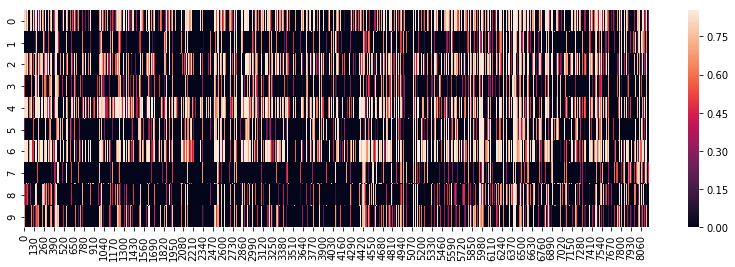

In [105]:
plt.figure(figsize=(14,4))
sns.heatmap(comp_proj_ks_dict2['OA27'])

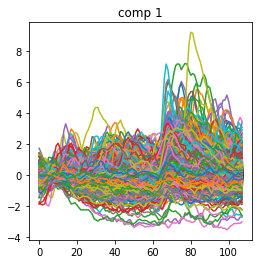

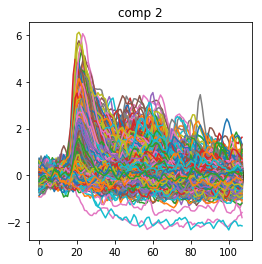

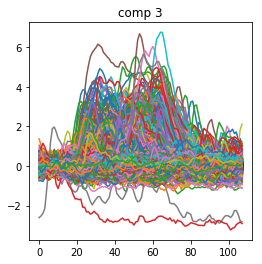

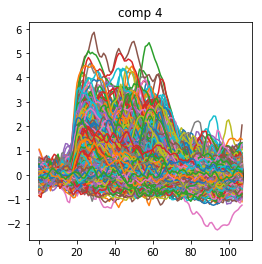

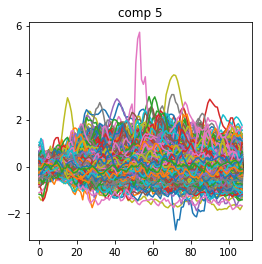

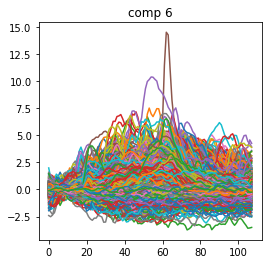

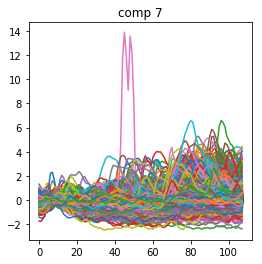

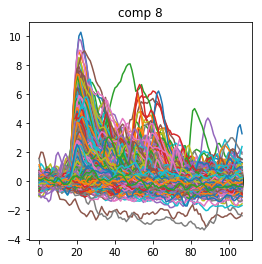

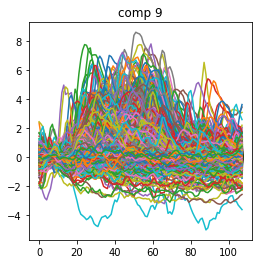

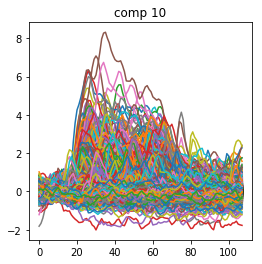

In [178]:
for compi in range(1,11):
    plt.figure(figsize=(4,4))
    plt.plot(thresh_norep_list[0][compi])
#     plt.plot(thresh_norep_list[0][compi][:, simp_comp_proj_dict['OA27'][compi-1, :]])
    plt.title('comp {}'.format(compi))

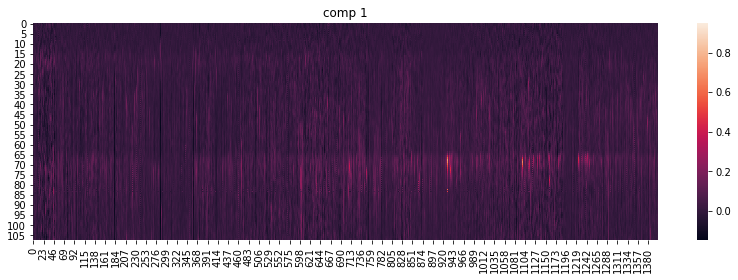

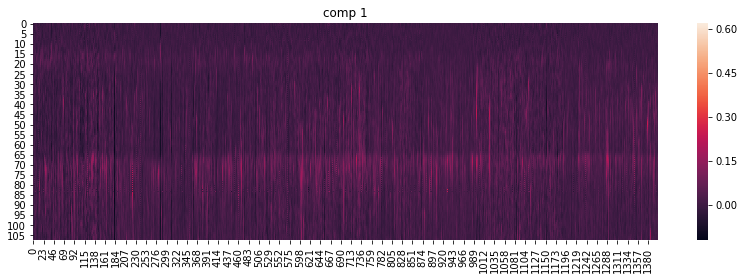

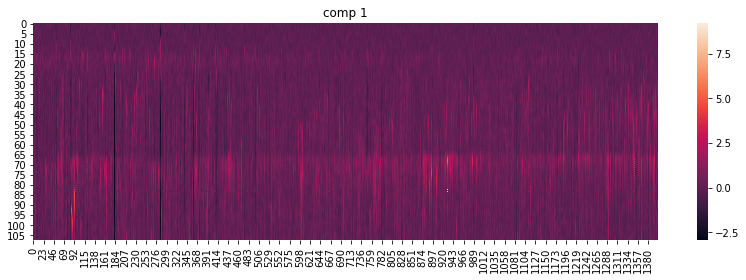

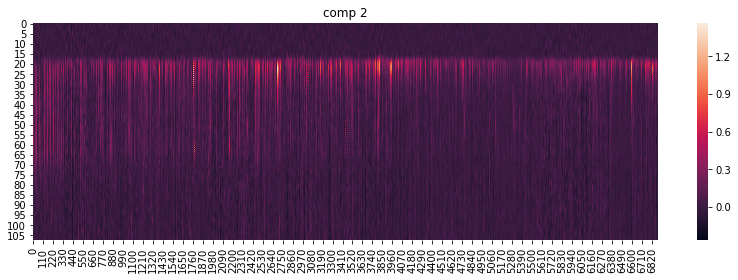

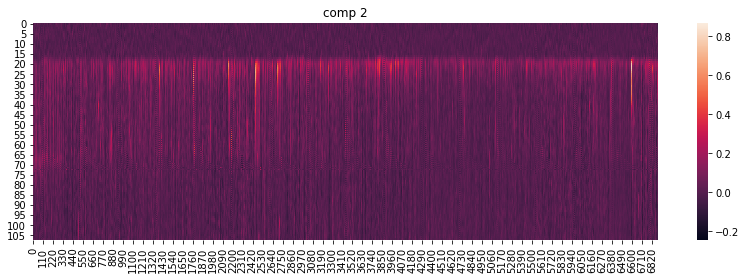

...

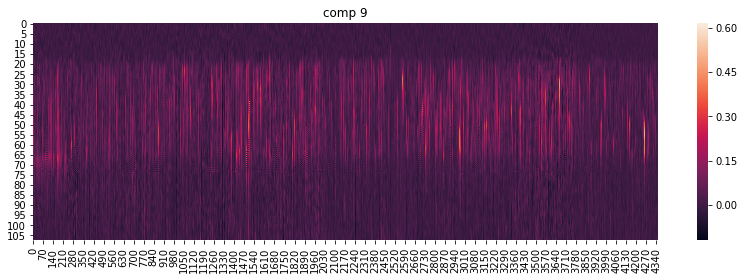

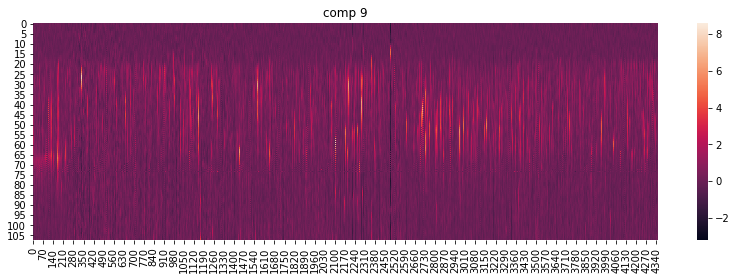

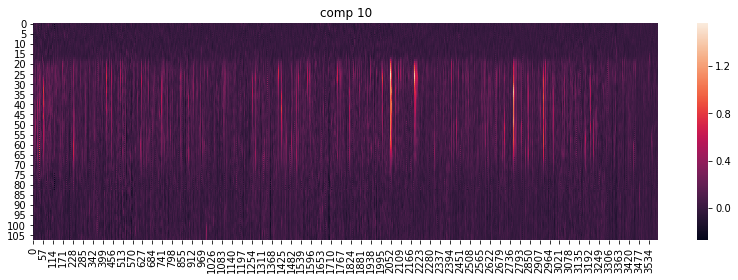

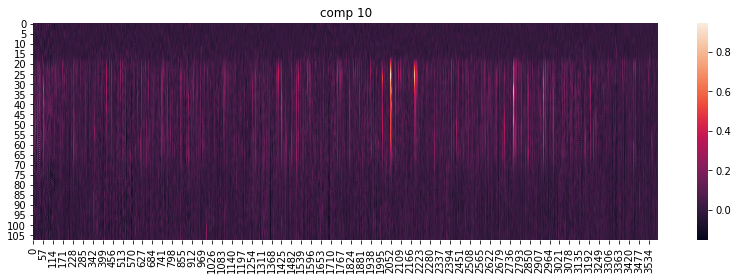

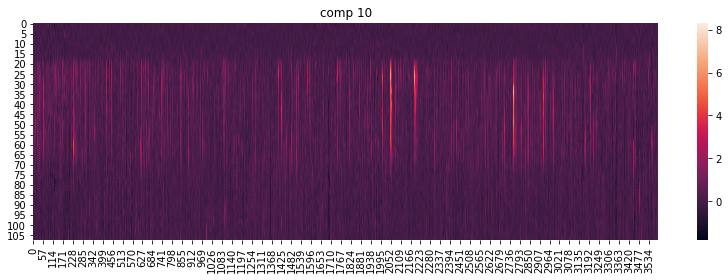

In [176]:
for compi in range(1,11):
    plt.figure(figsize=(14,4))
    sns.heatmap(projection_list[0][compi][:, simp_comp_proj_dict['OA27'][compi-1, :]])
    plt.title('comp {}'.format(compi))
    plt.figure(figsize=(14,4))
    sns.heatmap(thresh_list[0][compi][:, simp_comp_proj_dict['OA27'][compi-1, :]])
    plt.title('comp {}'.format(compi))
    plt.figure(figsize=(14,4))
    sns.heatmap(thresh_norep_list[0][compi][:, simp_comp_proj_dict['OA27'][compi-1, :]])
    plt.title('comp {}'.format(compi))

# fit your no rep rebel 

In [179]:
fits3 = {}
daily_avg_dict3 = {}
oris = [0, 135, 270]
# A = np.vstack(norm_gker).T
for mi, proj, meti in zip(mice, thresh_norep_list, meta_list):
    daily_avg_dict3[mi] = {}
    A = _get_fitting_template_defaults(mi)
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    fits3[mi] = {}
    for c, comp_n in enumerate(proj.keys()):
        fits3[mi]['component_{}'.format(c+1)] = {}
        ks_boo = simp_comp_proj_dict[mi][c, :]
        for ori in oris:
#             cell_mat = proj[comp_n][:, all_ori == ori]
            cell_mat = np.zeros((proj[comp_n].shape[0], len(u_days)))
            for dc, day_i in enumerate(u_days):
                day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
                cell_mat[:, dc] = np.nanmean(proj[comp_n][:, day_ori_bool & ks_boo], axis=1)
            all_tr = []
            for tr_n in range(cell_mat.shape[1]):
                b = deepcopy(cell_mat[:, tr_n])
                b[b < 0] = 0
                if np.sum(np.isnan(b)) == len(b):
                    sp_ans = np.zeros(4)
                    sp_ans[:] = np.nan
                    sp_ans = [sp_ans]
                else:
                    sp_ans = sp.optimize.nnls(A, b)
                all_tr.append(sp_ans[0])
            fits3[mi]['component_{}'.format(c+1)]['ori_{}'.format(ori)] = np.vstack(all_tr)
            fits3[mi]['component_{}'.format(c+1)]['trial_inds_{}'.format(ori)] = np.where(all_ori == ori)[0]
            daily_avg_dict3[mi][ori] = cell_mat

    print('Making progress: {} done.'.format(mi))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice


Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.


# fit just your thresholded data with the simple norep drivenness

In [168]:
fits2 = {}
daily_avg_dict2 = {}
oris = [0, 135, 270]
# A = np.vstack(norm_gker).T
for mi, proj, meti in zip(mice, thresh_list, meta_list):
    daily_avg_dict2[mi] = {}
    A = _get_fitting_template_defaults(mi)
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    fits2[mi] = {}
    for c, comp_n in enumerate(proj.keys()):
        fits2[mi]['component_{}'.format(c+1)] = {}
        ks_boo = simp_comp_proj_dict[mi][c, :]
        for ori in oris:
#             cell_mat = proj[comp_n][:, all_ori == ori]
            cell_mat = np.zeros((proj[comp_n].shape[0], len(u_days)))
            for dc, day_i in enumerate(u_days):
                day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
                cell_mat[:, dc] = np.nanmean(proj[comp_n][:, day_ori_bool & ks_boo], axis=1)
            all_tr = []
            for tr_n in range(cell_mat.shape[1]):
                b = deepcopy(cell_mat[:, tr_n])
                b[b < 0] = 0
                if np.sum(np.isnan(b)) == len(b):
                    sp_ans = np.zeros(4)
                    sp_ans[:] = np.nan
                    sp_ans = [sp_ans]
                else:
                    sp_ans = sp.optimize.nnls(A, b)
                all_tr.append(sp_ans[0])
            fits2[mi]['component_{}'.format(c+1)]['ori_{}'.format(ori)] = np.vstack(all_tr)
            fits2[mi]['component_{}'.format(c+1)]['trial_inds_{}'.format(ori)] = np.where(all_ori == ori)[0]
            daily_avg_dict2[mi][ori] = cell_mat

    print('Making progress: {} done.'.format(mi))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice


Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.


# DAILY: fit weighted average/projection of groups with simple filters

In [71]:
# subselect everything for only one stimulus
ks_thresh = 0

fits = {}
daily_avg_dict = {}
oris = [0, 135, 270]
# A = np.vstack(norm_gker).T
for mi, proj, meti in zip(mice, projection_list, meta_list):
    daily_avg_dict[mi] = {}
    A = _get_fitting_template_defaults(mi)
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    fits[mi] = {}
#     comp_mat = np.zeros((len(proj.keys()), proj[1].shape[0], len(u_days)))
    for c, comp_n in enumerate(proj.keys()):
        daily_avg_dict[mi][comp_n] = {}
        fits[mi]['component_{}'.format(c+1)] = {}
        ks_boo = comp_proj_ks_dict[mi][c, :] > ks_thresh 
        for ori in oris:
#             cell_mat = proj[comp_n][:, all_ori == ori]
            # get daily averages
            cell_mat = np.zeros((proj[comp_n].shape[0], len(u_days)))
            for dc, day_i in enumerate(u_days):
                day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
                cell_mat[:, dc] = np.nanmean(proj[comp_n][:, day_ori_bool & ks_boo], axis=1)
            all_tr = []
            for tr_n in range(cell_mat.shape[1]):
                b = deepcopy(cell_mat[:, tr_n])
                b[b < 0] = 0
                if np.sum(np.isnan(b)) == len(b):
                    sp_ans = np.zeros(4)
                    sp_ans[:] = np.nan
                    sp_ans = [sp_ans]
                else:
                    sp_ans = sp.optimize.nnls(A, b)
                all_tr.append(sp_ans[0])
            fits[mi]['component_{}'.format(c+1)]['ori_{}'.format(ori)] = np.vstack(all_tr)
            fits[mi]['component_{}'.format(c+1)]['trial_inds_{}'.format(ori)] = np.where(all_ori == ori)[0]
            daily_avg_dict[mi][comp_n][ori] = cell_mat
            
    print('Making progress: {} done.'.format(mi))


fits2 = {}
daily_avg_dict2 = {}
oris = [0, 135, 270]
# A = np.vstack(norm_gker).T
for mi, proj, meti in zip(mice, thresh_list, meta_list):
    daily_avg_dict2[mi] = {}
    A = _get_fitting_template_defaults(mi)
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    fits2[mi] = {}
    for c, comp_n in enumerate(proj.keys()):
        fits2[mi]['component_{}'.format(c+1)] = {}
        ks_boo = comp_proj_ks_dict2[mi][c, :] > ks_thresh 
        for ori in oris:
#             cell_mat = proj[comp_n][:, all_ori == ori]
            cell_mat = np.zeros((proj[comp_n].shape[0], len(u_days)))
            for dc, day_i in enumerate(u_days):
                day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
                cell_mat[:, dc] = np.nanmean(proj[comp_n][:, day_ori_bool & ks_boo], axis=1)
            all_tr = []
            for tr_n in range(cell_mat.shape[1]):
                b = deepcopy(cell_mat[:, tr_n])
                b[b < 0] = 0
                if np.sum(np.isnan(b)) == len(b):
                    sp_ans = np.zeros(4)
                    sp_ans[:] = np.nan
                    sp_ans = [sp_ans]
                else:
                    sp_ans = sp.optimize.nnls(A, b)
                all_tr.append(sp_ans[0])
            fits2[mi]['component_{}'.format(c+1)]['ori_{}'.format(ori)] = np.vstack(all_tr)
            fits2[mi]['component_{}'.format(c+1)]['trial_inds_{}'.format(ori)] = np.where(all_ori == ori)[0]
            daily_avg_dict2[mi][ori] = cell_mat

    print('Making progress: {} done.'.format(mi))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: Mean of empty slice


Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.


D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: RuntimeWarning: Mean of empty slice


Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.


# taking the average of the fits rather than fitting the average

In [109]:
fits = {}
oris = [0, 135, 270]
# A = np.vstack(norm_gker).T
for mi, proj, meti in zip(mice, projection_list, meta_list):
    A = _get_fitting_template_defaults(mi)
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    fits[mi] = {}
    for c, comp_n in enumerate(proj.keys()):
        fits[mi]['component_{}'.format(c+1)] = {}
        ks_boo = comp_proj_ks_dict[mi][c, :] > ks_thresh 
        cell_mat = proj[comp_n][:, :]
        all_tr = []
        for tr_n in range(cell_mat.shape[1]):
            b = deepcopy(cell_mat[:, tr_n])
            b[b < 0] = 0
            sp_ans = sp.optimize.nnls(A, b)
            all_tr.append(sp_ans[0])
        betas = np.vstack(all_tr)
        for ori in oris:
            new_tr = np.zeros((betas.shape[1], len(u_days)))
            new_tr[:] = np.nan
            for dc, day_i in enumerate(u_days):
                day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
                if np.sum((day_ori_bool & ks_boo)) < 10:
                    continue # no trials passed threshold for this day/comp
                new_tr[:, dc] = np.nanmean(betas[day_ori_bool & ks_boo,:], axis=0)
            fits[mi]['component_{}'.format(c+1)]['ori_{}'.format(ori)] = new_tr.T
            fits[mi]['component_{}'.format(c+1)]['trial_inds_{}'.format(ori)] = np.where(all_ori == ori)[0]

    print('Making progress: {} done.'.format(mi))


fits2 = {}
oris = [0, 135, 270]
# A = np.vstack(norm_gker).T
for mi, proj, meti in zip(mice, thresh_list, meta_list):
    A = _get_fitting_template_defaults(mi)
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    fits2[mi] = {}
    for c, comp_n in enumerate(proj.keys()):
        fits2[mi]['component_{}'.format(c+1)] = {}
        ks_boo = comp_proj_ks_dict[mi][c, :] > ks_thresh 
        cell_mat = proj[comp_n][:, :]
        all_tr = []
        for tr_n in range(cell_mat.shape[1]):
            b = deepcopy(cell_mat[:, tr_n])
            b[b < 0] = 0
            sp_ans = sp.optimize.nnls(A, b)
            all_tr.append(sp_ans[0])
        betas = np.vstack(all_tr)
        for ori in oris:
            new_tr = np.zeros((betas.shape[1], len(u_days)))
            new_tr[:] = np.nan
            for dc, day_i in enumerate(u_days):
                day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
                if np.sum((day_ori_bool & ks_boo)) < 10:
                    continue # no trials passed threshold for this day/comp
                new_tr[:, dc] = np.nanmean(betas[day_ori_bool & ks_boo, :], axis=0)
            fits2[mi]['component_{}'.format(c+1)]['ori_{}'.format(ori)] = new_tr.T
            fits2[mi]['component_{}'.format(c+1)]['trial_inds_{}'.format(ori)] = np.where(all_ori == ori)[0]

    print('Making progress: {} done.'.format(mi))

Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.
Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.


In [65]:
betas.shape
new_tr.shape

(8163, 27)

In [106]:
# for meta, ks, tensor, mouse in zip(my_meta_list, my_ks_list, my_tensor_list, mice):
#     ks_mat = _trial_driven_visually(tensor, mouse, sec=15.5)

proj_ks_dict = {}
proj_avg_dict = {}
for mouse, proj, meti in zip(mice, projection_list, meta_list):
    proj_ks_dict[mouse] = {}
    proj_avg_dict[mouse] = {}
    pre_proj_avg_dict[mouse] = {}
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    comp_list = []
    for k in proj:
        comp_list.append(proj[k][None, :, :])
    pseudoten = np.concatenate(comp_list, axis=0)
    for ori in np.unique(all_ori):
        new_pseudo = np.zeros((pseudoten.shape[0], pseudoten.shape[1], len(u_days)))
        pre_pseudo = np.zeros((pseudoten.shape[0], pseudoten.shape[1], len(u_days)))
        for dc, day_i in enumerate(u_days):
            day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
            new_pseudo[:, :, dc] = np.nanmean(pseudoten[:, :, day_ori_bool], axis=2)
            pre_day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty & (pre_proj_ks_dict[mi] > 1.31)
            pre_pseudo[:, :, dc] = np.nanmean(pseudoten[:, :, pre_day_ori_bool], axis=2)
#         ks_mat = cas.calc.tca._trial_driven_visually(new_pseudo, mouse, sec=15.5)
        ks_mat = cas.calc.tca._trial_driven_visually_bins(new_pseudo, mouse, sec=15.5)
        proj_ks_dict[mouse][ori] = ks_mat
        proj_avg_dict[mouse][ori] = new_pseudo
    print('Making progress: {} done.'.format(mouse))


Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.


In [104]:
stim_datapoints = np.floor(15.5*2)
bin_length = np.floor(15.5/2)
bin_starts = np.arange(0, stim_datapoints, bin_length)
bin_ends = np.arange(bin_length, stim_datapoints, bin_length)
bin_starts = bin_starts[:len(bin_ends)]
print(bin_starts)
print(bin_ends)

[ 0.  7. 14. 21.]
[ 7. 14. 21. 28.]


In [105]:
# for meta, ks, tensor, mouse in zip(my_meta_list, my_ks_list, my_tensor_list, mice):
#     ks_mat = _trial_driven_visually(tensor, mouse, sec=15.5)
proj_ks_dict2 = {}
proj_avg_dict2 = {}
for mouse, proj, meti in zip(mice, thresh_list, meta_list):
    proj_ks_dict2[mouse] = {}
    proj_avg_dict2[mouse] = {}
    all_ori = meti['orientation'].values
    all_days = meti.reset_index()['date'].values
    u_days = meti.reset_index()['date'].unique()
    firsty = _first100_bool(meti)
    comp_list = []
    for k in proj:
        comp_list.append(proj[k][None, :, :])
    pseudoten = np.concatenate(comp_list, axis=0)
    for ori in np.unique(all_ori):
        new_pseudo = np.zeros((pseudoten.shape[0], pseudoten.shape[1], len(u_days)))
        for dc, day_i in enumerate(u_days):
            day_ori_bool = (all_ori == ori) & (all_days == day_i) & firsty
            new_pseudo[:, :, dc] = np.nanmean(pseudoten[:, :, day_ori_bool], axis=2)
#         ks_mat = cas.calc.tca._trial_driven_visually(new_pseudo, mouse, sec=15.5)
        ks_mat = cas.calc.tca._trial_driven_visually_bins(new_pseudo, mouse, sec=15.5)
        proj_ks_dict2[mouse][ori] = ks_mat
        proj_avg_dict2[mouse][ori] = new_pseudo
    print('Making progress: {} done.'.format(mouse))

Making progress: OA27 done.
Making progress: VF226 done.
Making progress: OA67 done.
Making progress: OA32 done.
Making progress: OA34 done.
Making progress: OA36 done.
Making progress: OA26 done.


In [86]:
fits['OA27']['component_1'].keys()

dict_keys(['ori_0', 'trial_inds_0', 'ori_135', 'trial_inds_135', 'ori_270', 'trial_inds_270'])

In [120]:
tails.shape

(7, 27)

In [19]:
peaks = np.mean(proj_avg_dict2['OA27'][270][:, 15:22, :], axis=1)
tails = np.mean(proj_avg_dict2['OA27'][270][:, int(15.5*4)-15:int(15.5*4), :], axis=1)
peaks[peaks < 0] = 0
tails[tails < 0] = 0
for i in range(10):
    plt.figure()
    sns.heatmap(proj_avg_dict2['OA27'][270][i, :, :])
    plt.plot(proj_ks_dict2['OA27'][270][i, :]*10)
    denom = fits2['OA27']['component_{}'.format(i+1)]['ori_270'][:,1] + fits2['OA27']['component_{}'.format(i+1)]['ori_270'][:,0]
    fitplot = fits2['OA27']['component_{}'.format(i+1)]['ori_270'][:,0]/denom
    fitplot = (peaks[i,:] - tails[i,:])/(tails[i,:] + peaks[i,:])
    fitplot2 = (tails[i,:])/(tails[i,:] + peaks[i,:])
#     peak = proj_avg_dict2['OA27'][270][i-1, 15:22, :]
    plt.plot((fitplot-np.nanmin(fitplot))*100)

NameError: name 'proj_avg_dict2' is not defined

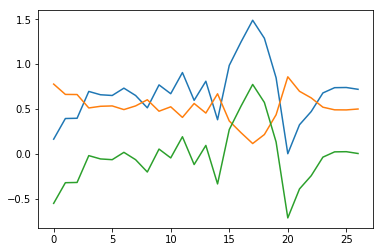

In [141]:
plt.plot(fitplot-np.nanmin(fitplot))
plt.plot(fitplot2)
plt.plot(fitplot)

# for weighted average data

In [ ]:
alpha = 0.7
color_vals = [[0.46, 0.85, 0.47, 0.1], [0.84, 0.12, 0.13, 0.1], [0.28, 0.68, 0.93, alpha]]
ksthresh = 1.31

for mi, meti, V in zip(mice, meta_list, model_list):
    
    # calculate change indices for days and reversal/learning
    dates = meti.reset_index()['date']
    udays = {d: c for c, d in enumerate(np.unique(dates))}
    ndays = np.diff([udays[i] for i in np.unique(dates)])
    day_x = np.where(ndays)[0] + 0.5
    
    # get indices for stimulus period
    tstart = int(np.floor(15.5))
    tend = int(np.floor(15.5*2-7))
#     sstart = int(np.floor(15.5*2))
    if mi in ['OA32', 'OA34', 'OA36']:
        send = int(np.floor(15.5*3))
    else:
        send = int(np.floor(15.5*4))
    sstart = int(send-7)
        
    # get your learning and reversal start indices 
    rev_ind = np.where(meti['learning_state'].isin(['learning']).values)[0][-1]
    rev_ind = np.where(np.unique(dates) == dates[rev_ind])[0] + 0.5
    if np.sum(meti['learning_state'].isin(['naive']).values) != 0:
        lear_ind = np.where(meti['learning_state'].isin(['naive']).values)[0][-1]
        lear_ind = np.where(np.unique(dates) == dates[lear_ind])[0] + 0.5
    else:
        lear_ind = 0 - 0.5

    for comp_n in range(1, len(fits[mi].keys())+1):
        
        fig = plt.figure(figsize=(20, 3))
        gs = fig.add_gridspec(100, 100)
        ax1 = fig.add_subplot(gs[:, :15])
        sns.despine()
        ax2 = fig.add_subplot(gs[:, 20:])
        sns.despine()
        
        temp_fac = V.results[rank][0].factors[1][:, comp_n-1]
        ax1.plot(temp_fac, linewidth=2)
        ax2.set_title('temporal factor')
        
        all_y = []
        for cs_type in ['plus', 'minus', 'neutral']:
            
            ori_type = 'ori_{}'.format(lookup[mi][cs_type])
            trial_type = 'trial_inds_{}'.format(lookup[mi][cs_type])

            fit_mat = fits[mi]['component_{}'.format(comp_n)][ori_type]
#             day_avg = proj_avg_dict[mi][lookup[mi][cs_type]][comp_n-1, :, :]
#             a = np.nanmean(day_avg[sstart:send, :], axis=0)  # sustained
#             b = np.nanmean(day_avg[tstart:tend, :], axis=0)  # transient
#             a[a < 0] = 0 
#             b[b < 0] = 0
#             y = (b - a)/(a + b)
            y = fit_mat[:,1]/(fit_mat[:,0] + fit_mat[:,1])
#             y = pd.DataFrame(data=y[:, None]).rolling(20).mean().values
#             x = fits[mi]['component_{}'.format(comp_n)][trial_type]
            all_y.extend(y)
            x = np.array([c for c, d in enumerate(np.unique(dates))])
            
#             ksboo = proj_ks_dict[mi][lookup[mi][cs_type]][comp_n-1, :] > ksthresh
#             ksboo = ksboo[x]
#             ax2.plot(x[ksboo], y[ksboo], 'o', color=color_dict[cs_type])
            ax2.plot(x, y, 'o', color=color_dict[cs_type])
            
        ax2.set_title('{}: component_{} sustainedness'.format(mi, comp_n))

        y_min = np.nanmin(all_y, axis=0)
        y_max = np.nanmax(all_y, axis=0)
        ax2.plot([lear_ind, lear_ind], [y_min, y_max], '--k')
        ax2.plot([rev_ind, rev_ind], [y_min, y_max], '--k')
#         ax2.plot([0, len(x)], [0.5, 0.5], '--k')
        ax2.plot([0, len(x)], [0, 0], '--k')
            
        if len(day_x) > 0:
            for k in day_x:
                ax2.plot([k, k], [y_min, y_max], color='#969696', linewidth=1)
                

# for thresholded data

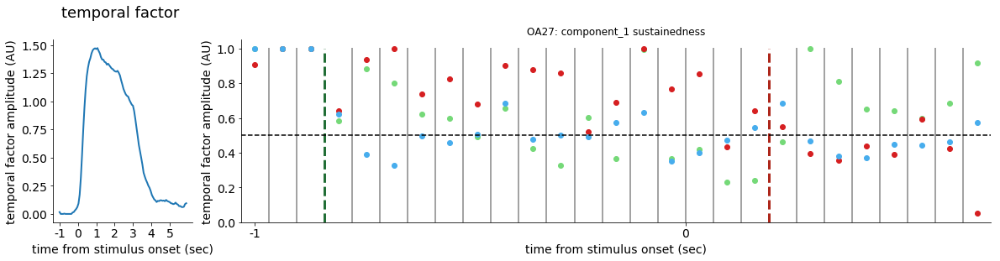

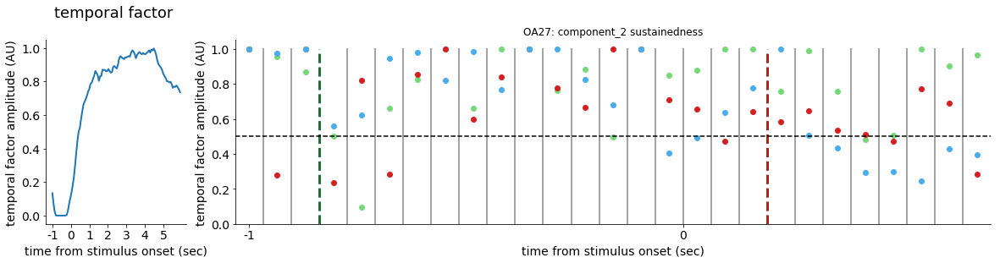

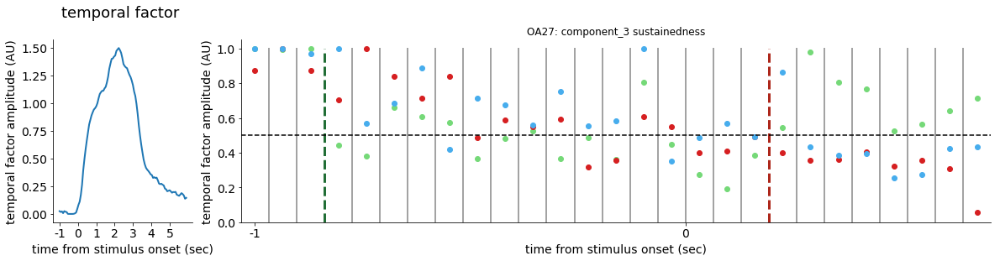

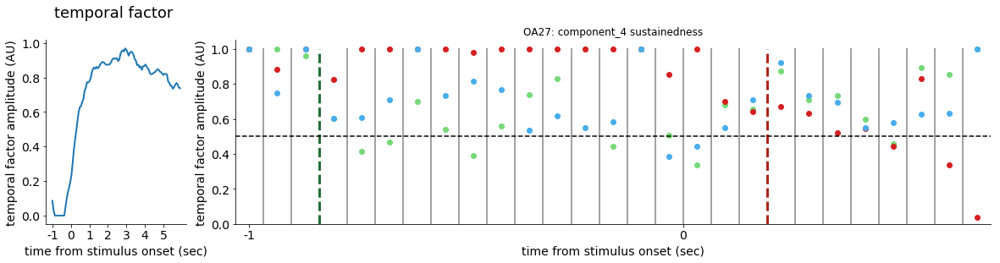

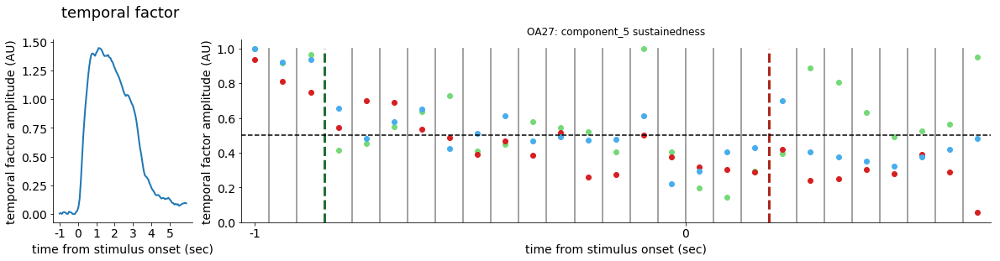

...

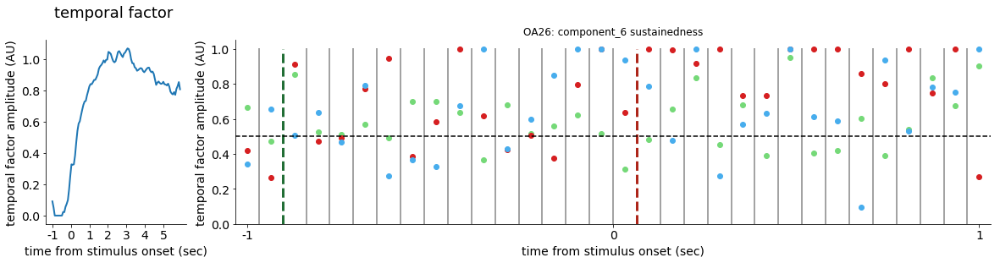

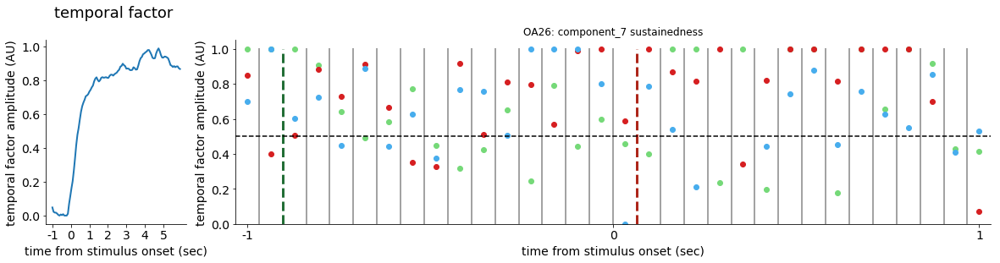

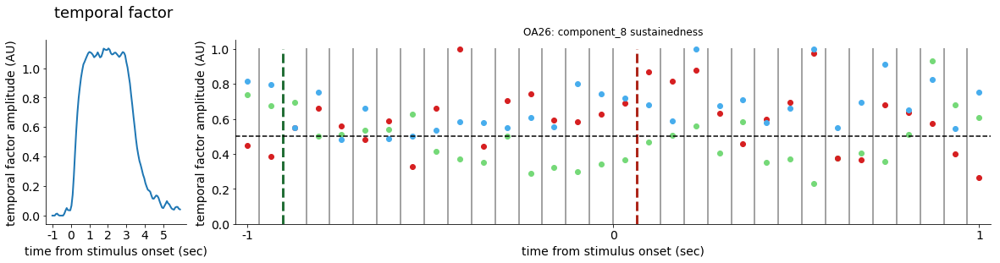

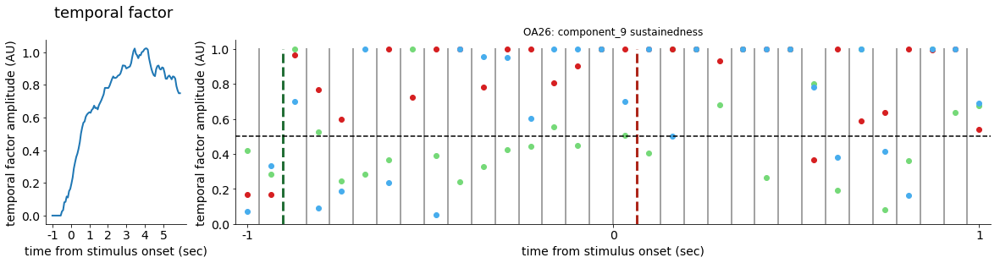

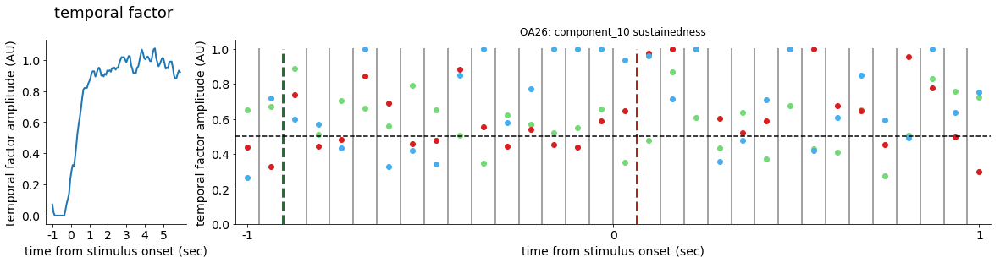

In [74]:
alpha = 0.7
color_vals = [[0.46, 0.85, 0.47, 0.1], [0.84, 0.12, 0.13, 0.1], [0.28, 0.68, 0.93, alpha]]
ksthresh = 0


times = np.arange(-1, 7, 1)
timepts = np.arange(0, 108, 15.5)

for mi, meti, V in zip(mice, meta_list, model_list):
    
    # calculate change indices for days and reversal/learning
    dates = meti.reset_index()['date']
    udays = {d: c for c, d in enumerate(np.unique(dates))}
    ndays = np.diff([udays[i] for i in np.unique(dates)])
    day_x = np.where(ndays)[0] + 0.5
    
    # get your learning and reversal start indices 
    rev_ind = np.where(meti['learning_state'].isin(['learning']).values)[0][-1]
    rev_ind = np.where(np.unique(dates) == dates[rev_ind])[0] + 0.5
    if np.sum(meti['learning_state'].isin(['naive']).values) != 0:
        lear_ind = np.where(meti['learning_state'].isin(['naive']).values)[0][-1]
        lear_ind = np.where(np.unique(dates) == dates[lear_ind])[0] + 0.5
    else:
        lear_ind = 0 - 0.5

    for comp_n in range(1, len(fits[mi].keys())+1):
        
        fig = plt.figure(figsize=(20, 4))
        gs = fig.add_gridspec(100, 100)
        ax1 = fig.add_subplot(gs[:, :15])
        sns.despine()
        ax2 = fig.add_subplot(gs[:, 20:])
        sns.despine()
        
        temp_fac = V.results[rank][0].factors[1][:, comp_n-1]
        ax1.plot(temp_fac, linewidth=2)
        ax1.set_title('temporal factor \n', size=18)
        ax1.set_xticks(timepts)
        ax1.set_xticklabels(times, size=12)
        ax1.tick_params(axis='both', which='major', labelsize=14)
        ax1.set_xlabel('time from stimulus onset (sec)', size=14)
        ax1.set_ylabel('temporal factor amplitude (AU)', size=14)
        
        ax2.set_xticks(timepts)
        ax2.set_xticklabels(times, size=12)
        ax2.tick_params(axis='both', which='major', labelsize=14)
        ax2.set_xlabel('time from stimulus onset (sec)', size=14)
        ax2.set_ylabel('temporal factor amplitude (AU)', size=14)
        
        all_y = []
        for cs_type in ['plus', 'minus', 'neutral']:
            
            ori_type = 'ori_{}'.format(lookup[mi][cs_type])
            trial_type = 'trial_inds_{}'.format(lookup[mi][cs_type])

            fit_mat = fits2[mi]['component_{}'.format(comp_n)][ori_type]
            y = fit_mat[:,1]/(fit_mat[:,0] + fit_mat[:,1])
#             y = pd.DataFrame(data=y[:, None]).rolling(20).mean().values
#             x = fits[mi]['component_{}'.format(comp_n)][trial_type]
            all_y.extend(y)
            x = np.array([c for c, d in enumerate(np.unique(dates))])
            
#             ksboo = proj_ks_dict2[mi][lookup[mi][cs_type]][comp_n-1, :] > ksthresh
#             ksboo = ksboo[x]
#             ax2.plot(x[ksboo], y[ksboo], 'o', color=color_dict[cs_type])
            ax2.plot(x, y, 'o', color=color_dict[cs_type])
            
        ax2.set_title('{}: component_{} sustainedness'.format(mi, comp_n))

        y_min = 0 #np.nanmin(all_y, axis=0)
        y_max = 1 #np.nanmax(all_y, axis=0)
        if len(day_x) > 0:
            for k in day_x:
                if k == lear_ind or k == rev_ind:
                    continue
                ax2.plot([k, k], [y_min, y_max], color=color_dict['gray'], linewidth=2)
        ax2.plot([lear_ind, lear_ind], [y_min, y_max], '--', color=color_dict['learning'], linewidth=3)
        ax2.plot([rev_ind, rev_ind], [y_min, y_max], '--', color=color_dict['reversal'], linewidth=3)
        ax2.plot([-0.5, len(x)-0.5], [0.5, 0.5], '--k')
        ax2.set_ylim([y_min, y_max+0.05])
        ax2.set_xlim([-0.5, len(x)-0.5])

# Tuning index by learning stage, per component average

In [227]:
# for each orientation get mean response
end = int(15.5*4)
start = end-16
first_boo = _first100_bool(meta_list[0])
dp_threshold = 2

# preallocate
all_means2 = np.zeros((len(meta_list[0]['orientation'].unique()), 5, len(thresh_list[0].keys())))
for c_comp, ki in enumerate(thresh_list[0]):
    cell_mat = deepcopy(thresh_list[0][ki])
    new_mat = np.empty(cell_mat.shape)
    new_mat[:] = np.nan

    # take averages for CS per day and create an index of tuning across days
#     day_means = np.zeros((len(meta_list[0]['orientation'].unique()),
#                           len(meta_list[0].reset_index()['date'].unique())))
    c_day = 0
    for n_day in meta_list[0]['learning_state'].unique():
        day_bool = meta_list[0]['learning_state'].isin([n_day]).values
        if n_day == 'naive':
            ori_means = np.zeros((len(meta_list[0]['orientation'].unique())))
            for c_ori, n_ori in enumerate(meta_list[0]['orientation'].unique()):
                ori_bool = meta_list[0]['orientation'].isin([n_ori]).values
    #             for n_te in meta_list[0]['trialerror'].unique():
    #                 te_bool = meta_list[0]['trialerror'].isin([n_te]).values
                total_bool = ori_bool & day_bool & first_boo

                # if there are no trials of a given type skip
                if np.sum(total_bool) == 0:
                    continue

                # subtract mean trace from each cell
    #             ori_means[c_ori] = np.nanmean(np.nanmean(cell_mat[start:end, total_bool], axis=1))
                all_means[c_ori, c_day, c_comp] = np.nanmean(np.nanmean(cell_mat[start:end, total_bool], axis=1))
            c_day += 1
        else:
            ori_means = np.zeros((len(meta_list[0]['orientation'].unique())))
            for dpi in ['low_dp', 'high_dp']:
                if dpi == 'high_dp':
                    dp_bool = cas.utils.add_dprime_to_meta(meta_list[0])['dprime'].values >= dp_threshold
                elif dpi == 'low_dp':
                    dp_bool = cas.utils.add_dprime_to_meta(meta_list[0])['dprime'].values < dp_threshold
                for c_ori, n_ori in enumerate(meta_list[0]['orientation'].unique()):
                    ori_bool = meta_list[0]['orientation'].isin([n_ori]).values
        #             for n_te in meta_list[0]['trialerror'].unique():
        #                 te_bool = meta_list[0]['trialerror'].isin([n_te]).values
                    total_bool = ori_bool & day_bool & first_boo & dp_bool

                    # if there are no trials of a given type skip
                    if np.sum(total_bool) == 0:
                        continue

                    # subtract mean trace from each cell
        #             ori_means[c_ori] = np.nanmean(np.nanmean(cell_mat[start:end, total_bool], axis=1))
                    all_means2[c_ori, c_day, c_comp] = np.nanmean(np.nanmean(cell_mat[start:end, total_bool], axis=1))
                c_day += 1
    
    all_means2[all_means2 < 0] = 0

# Tuning index by learning stage, per cell

In [219]:
# for each orientation get mean response of cells
end = int(15.5*4)
start = end-16
first_boo = _first100_bool(meta_list[0])
dp_threshold = 2

cell_means = np.nanmean(tensor_list[0][:, start:end, :], axis=1)

# preallocate
all_means = np.zeros((len(meta_list[0]['orientation'].unique()), 5, cell_means.shape[0]))
for c_comp in range(cell_means.shape[0]):
    cell_mat = cell_means[c_comp, :]
#     new_mat = np.empty(cell_mat.shape)
#     new_mat[:] = np.nan
    # take averages for CS per day and create an index of tuning across days
#     day_means = np.zeros((len(meta_list[0]['orientation'].unique()),
#                           len(meta_list[0].reset_index()['date'].unique())))
    c_day = 0
    for n_day in meta_list[0]['learning_state'].unique():
        day_bool = meta_list[0]['learning_state'].isin([n_day]).values
        if n_day == 'naive':
            ori_means = np.zeros((len(meta_list[0]['orientation'].unique())))
            for c_ori, n_ori in enumerate(meta_list[0]['orientation'].unique()):
                ori_bool = meta_list[0]['orientation'].isin([n_ori]).values
    #             for n_te in meta_list[0]['trialerror'].unique():
    #                 te_bool = meta_list[0]['trialerror'].isin([n_te]).values
                total_bool = ori_bool & day_bool & first_boo

                # if there are no trials of a given type skip
                if np.sum(total_bool) == 0:
                    continue

                # subtract mean trace from each cell
    #             ori_means[c_ori] = np.nanmean(np.nanmean(cell_mat[start:end, total_bool], axis=1))
                all_means[c_ori, c_day, c_comp] = np.nanmean(cell_mat[total_bool])
            c_day += 1
        else:
            ori_means = np.zeros((len(meta_list[0]['orientation'].unique())))
            for dpi in ['low_dp', 'high_dp']:
                if dpi == 'high_dp':
                    dp_bool = cas.utils.add_dprime_to_meta(meta_list[0])['dprime'].values >= dp_threshold
                elif dpi == 'low_dp':
                    dp_bool = cas.utils.add_dprime_to_meta(meta_list[0])['dprime'].values < dp_threshold
                for c_ori, n_ori in enumerate(meta_list[0]['orientation'].unique()):
                    ori_bool = meta_list[0]['orientation'].isin([n_ori]).values
        #             for n_te in meta_list[0]['trialerror'].unique():
        #                 te_bool = meta_list[0]['trialerror'].isin([n_te]).values
                    total_bool = ori_bool & day_bool & first_boo & dp_bool

                    # if there are no trials of a given type skip
                    if np.sum(total_bool) == 0:
                        continue

                    # subtract mean trace from each cell
        #             ori_means[c_ori] = np.nanmean(np.nanmean(cell_mat[start:end, total_bool], axis=1))
                    all_means[c_ori, c_day, c_comp] = np.nanmean(cell_mat[total_bool])
                c_day += 1
    
    all_means3[all_means3 < 0] = 0
    
    droppers = np.max(all_means3, axis=0) < 0.01
    tuning_index = np.max(all_means3, axis=0)/np.mean(all_means3, axis=0)
    tuning_index[droppers] = np.nan

    plt.plot(tuning_index)
    plt.legend(bbox_to_anchor=(1.05, 1), labels=[k for k in thresh_list[0].keys()])
    ply

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: Mean of empty slice
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: Mean of empty slice


# take stage averages of sustainedness, per component average

ValueError: shape mismatch: value array of shape (27,) could not be broadcast to indexing result of shape (2889,)

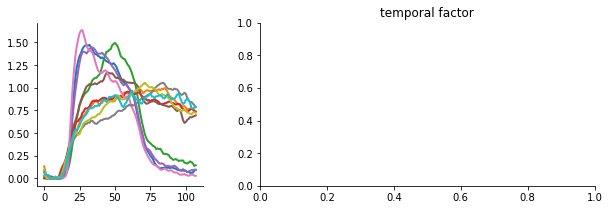

In [75]:
alpha = 0.7
color_vals = [[0.46, 0.85, 0.47, 0.1], [0.84, 0.12, 0.13, 0.1], [0.28, 0.68, 0.93, alpha]]
ksthresh = 0 #35
dp_threshold = 2

for mi, meti, V in zip(mice, meta_list, model_list):
    
    # calculate change indices for days and reversal/learning
    dates = meti.reset_index()['date']
    udays = {d: c for c, d in enumerate(np.unique(dates))}
    ndays = np.diff([udays[i] for i in dates])
    day_x = np.where(ndays)[0] + 0.5
    
    # get your learning and reversal start indices 
    rev_ind = np.where(meti['learning_state'].isin(['learning']).values)[0][-1]
    if np.sum(meti['learning_state'].isin(['naive']).values) != 0:
        lear_ind = np.where(meti['learning_state'].isin(['naive']).values)[0][-1]
    else:
        lear_ind = 0
    
    fig = plt.figure(figsize=(10, 3))
    gs = fig.add_gridspec(100, 100)
    ax1 = fig.add_subplot(gs[:, :30])
    sns.despine()
    ax2 = fig.add_subplot(gs[:, 40:])
    sns.despine()

    temp_fac = V.results[rank][0].factors[1][:, :]
    ax1.plot(temp_fac, linewidth=2)
    ax2.set_title('temporal factor')
        
    first_boo = _first100_bool(meti)
#     all_means3 = np.zeros((len(meti['orientation'].unique()), 5, len(fits[mi].keys())))
    all_means3 = np.zeros((1, 5, len(fits[mi].keys())))
    all_means3[:] = np.nan
    for comp_n in range(1, len(fits[mi].keys())+1):
        
#         fig = plt.figure(figsize=(6, 3))
#         gs = fig.add_gridspec(100, 100)
#         ax1 = fig.add_subplot(gs[:, :30])
#         sns.despine()
#         ax2 = fig.add_subplot(gs[:, 35:])
#         sns.despine()
        
#         temp_fac = V.results[rank][0].factors[1][:, comp_n-1]
#         ax1.plot(temp_fac, linewidth=2)
#         ax2.set_title('temporal factor')
        
        y_vec = np.zeros((len(meti)))
        for cs_type in ['plus', 'minus', 'neutral']:
            ori_type = 'ori_{}'.format(lookup[mi][cs_type])
            trial_type = 'trial_inds_{}'.format(lookup[mi][cs_type])
            fit_mat = fits[mi]['component_{}'.format(comp_n)][ori_type]
            x = fits[mi]['component_{}'.format(comp_n)][trial_type]
            y = fit_mat[:,1]/(fit_mat[:,1] + fit_mat[:,0])
            y_vec[x] = y
            ks_boo = proj_ks_dict[mi][lookup[mi][cs_type]][comp_n-1, :] < ksthresh
            y_vec[ks_boo] = np.nan
#         ax2.plot(y_vec, '-o')
        
        stage_labels = []
        c_day = 0
        for n_day in meta_list[0]['learning_state'].unique(): # forcing to include all stages
            day_bool = meti['learning_state'].isin([n_day]).values
            if n_day == 'naive':
#                 for c_ori, n_ori in enumerate(meti['orientation'].unique()):
#                     ori_bool = meti['orientation'].isin([n_ori]).values
#                     total_bool = ori_bool & day_bool & first_boo
                total_bool = day_bool & first_boo & (y_vec < 1)
                stage_labels.append(n_day)
                    # if there are no trials of a given type skip
                if np.sum(total_bool) == 0:
#                     print('Skipped empty for: naive')
                    c_day += 1
                    continue

                # subtract mean trace from each cell
#                 print(np.nanmean(y_vec[total_bool]))
                all_means3[0, c_day, comp_n-1] = np.nanmean(y_vec[total_bool])
                c_day += 1
            else:
                for dpi in ['low_dp', 'high_dp']:
                    if dpi == 'high_dp':
                        dp_bool = cas.utils.add_dprime_to_meta(meti)['dprime'].values >= dp_threshold
                    elif dpi == 'low_dp':
                        dp_bool = cas.utils.add_dprime_to_meta(meti)['dprime'].values < dp_threshold
#                     for c_ori, n_ori in enumerate(meti['orientation'].unique()):
#                         ori_bool = meti['orientation'].isin([n_ori]).values
                    total_bool = day_bool & first_boo & dp_bool & (y_vec < 1)
                    
                    stage_labels.append('{} {}'.format(dpi, n_day))
                    # if there are no trials of a given type skip
                    if np.sum(total_bool) == 0:
                        print('Skipped empty for: {} {}'.format(dpi, n_day))
                        continue

                    # subtract mean trace from each cell
                    all_means3[0, c_day, comp_n-1] = np.nanmean(y_vec[total_bool])
                    c_day += 1
    
#     all_means3[all_means3 < 0] = 0
#     droppers = np.max(all_means3, axis=0) > 0.01
#     tuning_index = np.max(all_means3, axis=0)/np.mean(all_means3, axis=0)
    tuning_index = all_means3.squeeze()
    tuning_index = tuning_index/tuning_index[2, :]
#     tuning_index[droppers] = np.nan

    ax2.plot(tuning_index)
    ax2.legend(bbox_to_anchor=(1.05, 1), labels=['component {}'.format(k) for k in thresh_list[0].keys()])
    ax2.set_title('{}: Sustained responses across stages of learning'.format(mi))
    ax1.set_title('{}: TCA component\n weighted averages'.format(words[0]))
    ax1.set_xlabel('time in trial')
    ax1.set_ylabel('factor weight')
    stim_window_ticks = np.arange(0, 108, 15.5)
    stim_window_labels = np.arange(-1, 7, 1)
    ax1.set_xticks(stim_window_ticks)
    ax1.set_xticklabels(labels=stim_window_labels)
    ax2.set_xlabel('learning stage')
    ax2.set_ylabel(r'normalized sustainedness ($\beta_{sus}$/($\beta_{sus}$+$\beta_{trans}$))')
    stage_ticks = np.arange(0, 5, 1)
    ax2.set_xticks(stage_ticks)
    ax2.set_xticklabels(labels=stage_labels, rotation=45, ha='right')
#     plt.savefig('.//Adaptation plots//{}_{}_sustainedness_weighted_avg_stages.pdf'.format(mi, words[0]), bbox_inches='tight')

In [75]:
meti.groupby(['date', 'learning_state']).max()

orientation condition  trialerror  hunger  \
mouse date   run trial_idx                                              
OA26  170208 1   0                  270      plus         1.0  hungry   
                 1                  270      plus         1.0  hungry   
                 2                    0   neutral         2.0  hungry   
                 3                    0   neutral         2.0  hungry   
                 4                  135     minus         4.0  hungry   

                           learning_state       tag  firstlick  firstlickbout  \
mouse date   run trial_idx                                                      
OA26  170208 1   0                  naive  standard        NaN            NaN   
                 1                  naive  standard        NaN            NaN   
                 2                  naive  standard        NaN            NaN   
                 3                  naive  standard        NaN            NaN   
                 4                  naive  standard        NaN            NaN   

                            ensure  quinine      speed  pre_speed  \
mouse date   run trial_idx                                          
OA26  170208 1   0             NaN      NaN   0.000000   0.000000   
                 1             NaN      NaN   0.000000   0.000000   
                 2             NaN      NaN   0.000000   0.000000   
                 3             NaN      NaN  21.419649  23.491501   
                 4             NaN      NaN   7.826901  20.269073   

                            anticipatory_licks  pre_licks  pupil  pre_pupil  \
mouse date   run trial_idx                                                    
OA26  170208 1   0                         NaN        NaN    NaN        NaN   
                 1                         NaN        NaN    NaN        NaN   
                 2                         NaN        NaN    NaN        NaN   
                 3                         NaN        NaN    NaN        NaN   
                 4                         NaN        NaN    NaN        NaN   

                            brainmotion  
mouse date   run trial_idx               
OA26  170208 1   0             0.000000  
                 1             0.000000  
                 2             0.000000  
                 3            21.419649  
                 4             7.826901

In [ ]:
alpha = 0.7
color_vals = [[0.46, 0.85, 0.47, 0.1], [0.84, 0.12, 0.13, 0.1], [0.28, 0.68, 0.93, alpha]]
ksthresh = 1.31 #35
dp_threshold = 2
t_or_wa = 'weighted_avg'

if t_or_wa == 'thresh':
    which_fits = deepcopy(fits2)
#     which_ks = deepcopy(proj_ks_dict2)
elif t_or_wa == 'weighted_avg':
    which_fits = deepcopy(fits)
#     which_ks = deepcopy(proj_ks_dict)

wtf = {}
wtf['OA27'] = {}
for ori in ['plus', 'minus', 'neutral']:
    wtf['OA27'][ori] = {}
    ti_cont, mi_cont, ci_cont = [], [], []
    ti_norm_cont = []
    for mi, meti, V in zip(mice, meta_list, model_list):
        
        if mi not in ['OA27']:
            continue
            
        # add dprime to meti
        meti = cas.utils.add_dprime_to_meta(meti)
        
        # get indices for stimulus period
        tstart = int(np.floor(15.5))
        tend = int(np.floor(15.5*2))
        sstart = int(np.floor(15.5*2))
        if mi in ['OA32', 'OA34', 'OA36']:
            send = int(np.floor(15.5*3))
        else:
            send = int(np.floor(15.5*4))
        
        # calculate change indices for days and reversal/learning
        dates = meti.reset_index()['date']
        udays = {d: c for c, d in enumerate(np.unique(dates))}
        ndays = np.diff([udays[i] for i in np.unique(dates)])
        day_x = np.where(ndays)[0] + 0.5

        # get your learning and reversal start indices 
        rev_ind = np.where(meti['learning_state'].isin(['learning']).values)[0][-1]
        rev_ind = np.where(np.unique(dates) == dates[rev_ind])[0] + 0.5
        if np.sum(meti['learning_state'].isin(['naive']).values) != 0:
            lear_ind = np.where(meti['learning_state'].isin(['naive']).values)[0][-1]
            lear_ind = np.where(np.unique(dates) == dates[lear_ind])[0] + 0.5
        else:
            lear_ind = 0 - 0.5

        fig = plt.figure(figsize=(10, 3))
        gs = fig.add_gridspec(100, 100)
        ax1 = fig.add_subplot(gs[:, :30])
        sns.despine()
        ax2 = fig.add_subplot(gs[:, 40:])
        sns.despine()

        temp_fac = V.results[rank][0].factors[1][:, :]
        ax1.plot(temp_fac, linewidth=2)
        ax2.set_title('temporal factor')

#         ori_bool = meti['orientation'].isin([lookup[mi][ori]])
    #     ori_bool = meti['orientation'].isin([0, 135, 270])

        first_boo = _first100_bool(meti)
    #     all_means3 = np.zeros((len(meti['orientation'].unique()), 5, len(fits[mi].keys())))
        all_means3 = np.zeros((1, 5, len(which_fits[mi].keys())))
        all_means3[:] = np.nan
        for comp_n in range(1, len(which_fits[mi].keys())+1):
        
            mi_cont.append(mi)
            ci_cont.append(comp_n)
            
            # don't consider offset components
            temp_fac = V.results[rank][0].factors[1][:, comp_n-1]
            if np.argmax(temp_fac) > send:
                continue
            
            ori_type = 'ori_{}'.format(lookup[mi][cs_type])
            trial_type = 'trial_inds_{}'.format(lookup[mi][cs_type])
            fit_mat = which_fits[mi]['component_{}'.format(comp_n)][ori_type]
            x = which_fits[mi]['component_{}'.format(comp_n)][trial_type]
#             day_avg = proj_avg_dict[mi][lookup[mi][cs_type]][comp_n-1, :, :]
#             a = np.nanmean(day_avg[sstart:send, :], axis=0)  # sustained
#             b = np.nanmean(day_avg[tstart:tend, :], axis=0)  # transient
#             a[a < 0] = 0 
#             b[b < 0] = 0
#             y_vec = (b-a)/(a + b)
            y_vec = fit_mat[:,1]/(fit_mat[:,1] + fit_mat[:,0])
            wtf['OA27'][ori][comp_n] = y_vec
    

In [ ]:
wtf

In [ ]:
plt.plot(wtf['OA27']['plus'][])
plt.plot(wtf['OA27']['minus'][1])

# make a ton of plots: both of the compoenents averaged by stage and the indices plotted against one another

Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1


D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: Mean of empty slice


Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1


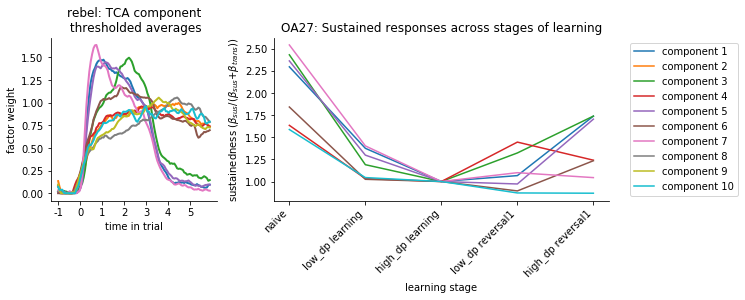

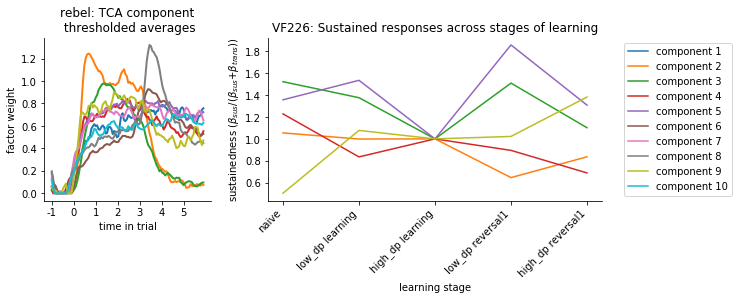

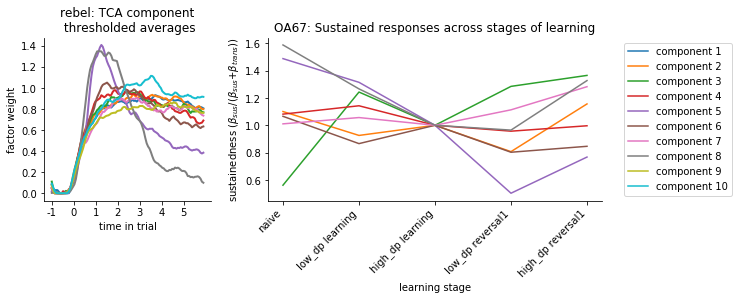

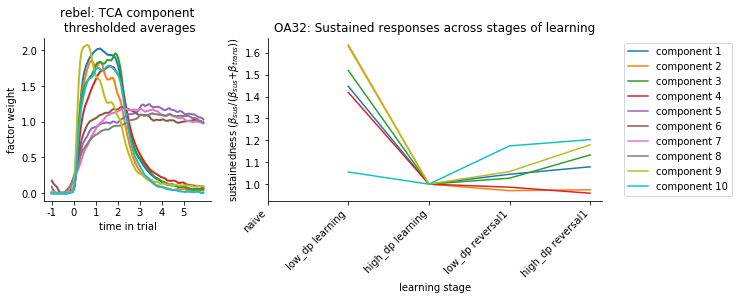

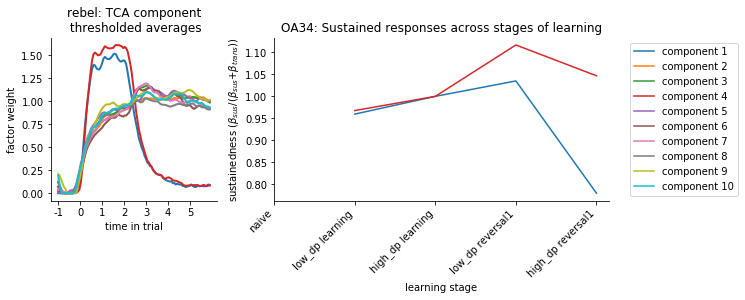

...

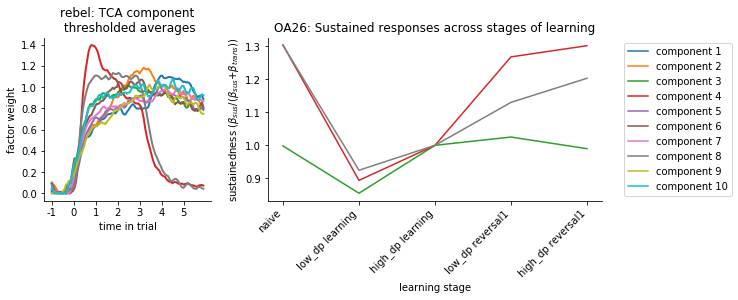

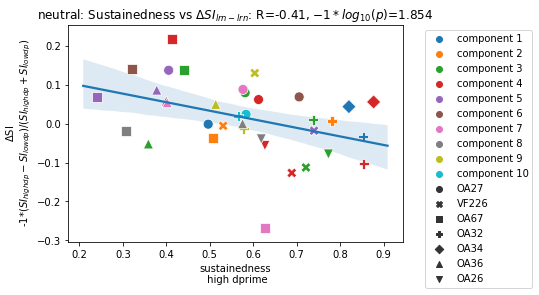

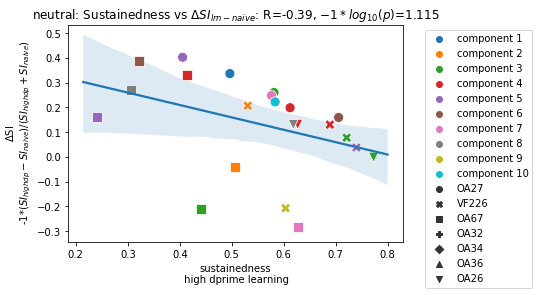

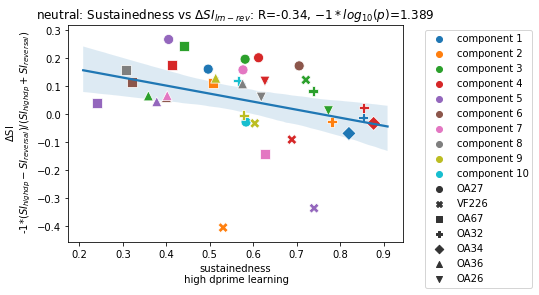

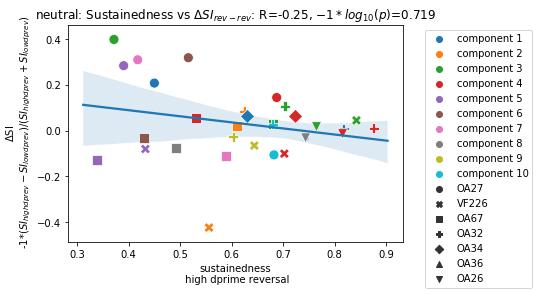

In [76]:
alpha = 0.7
color_vals = [[0.46, 0.85, 0.47, 0.1], [0.84, 0.12, 0.13, 0.1], [0.28, 0.68, 0.93, alpha]]
ksthresh = 0 #35
dp_threshold = 2
t_or_wa = 'thresh'

folder = 'rebel meansub sustainedness index plots daily thresh fit on means'
# folder = 'Sustainedness index plots daily thresh mean of trials fits'
if not os.path.isdir(folder): os.mkdir(folder)
save_dir = os.path.join(folder, 'Sustainedness plots')
if not os.path.isdir(save_dir): os.mkdir(save_dir)

if t_or_wa == 'thresh':
    which_fits = deepcopy(fits2)
#     which_ks = deepcopy(proj_ks_dict2)
elif t_or_wa == 'weighted_avg':
    which_fits = deepcopy(fits)
#     which_ks = deepcopy(proj_ks_dict)

for ori in ['plus', 'minus', 'neutral']:
    ti_cont, mi_cont, ci_cont = [], [], []
    ti_norm_cont = []
    for mi, meti, V in zip(mice, meta_list, model_list):
        
        # add dprime to meti
        meti = cas.utils.add_dprime_to_meta(meti)
        
        # get indices for stimulus period
        tstart = int(np.floor(15.5))
        tend = int(np.floor(15.5*1.5))
        if mi in ['OA32', 'OA34', 'OA36']:
            send = int(np.floor(15.5*3))
        else:
            send = int(np.floor(15.5*4))
        sstart = int(np.floor(send-15.5/2))
        
        # calculate change indices for days and reversal/learning
        dates = meti.reset_index()['date']
        udays = {d: c for c, d in enumerate(np.unique(dates))}
        ndays = np.diff([udays[i] for i in np.unique(dates)])
        day_x = np.where(ndays)[0] + 0.5

        # get your learning and reversal start indices 
        rev_ind = np.where(meti['learning_state'].isin(['learning']).values)[0][-1]
        rev_ind = np.where(np.unique(dates) == dates[rev_ind])[0] + 0.5
        if np.sum(meti['learning_state'].isin(['naive']).values) != 0:
            lear_ind = np.where(meti['learning_state'].isin(['naive']).values)[0][-1]
            lear_ind = np.where(np.unique(dates) == dates[lear_ind])[0] + 0.5
        else:
            lear_ind = 0 - 0.5

        fig = plt.figure(figsize=(10, 3))
        gs = fig.add_gridspec(100, 100)
        ax1 = fig.add_subplot(gs[:, :30])
        sns.despine()
        ax2 = fig.add_subplot(gs[:, 40:])
        sns.despine()

        temp_fac = V.results[rank][0].factors[1][:, :]
        ax1.plot(temp_fac, linewidth=2)
        ax2.set_title('temporal factor')

#         ori_bool = meti['orientation'].isin([lookup[mi][ori]])
    #     ori_bool = meti['orientation'].isin([0, 135, 270])

        first_boo = _first100_bool(meti)
    #     all_means3 = np.zeros((len(meti['orientation'].unique()), 5, len(fits[mi].keys())))
        all_means3 = np.zeros((1, 5, len(which_fits[mi].keys())))
        all_means3[:] = np.nan
        for comp_n in range(1, len(which_fits[mi].keys())+1):

            mi_cont.append(mi)
            ci_cont.append(comp_n)
            
            # don't consider offset components
            temp_fac = V.results[rank][0].factors[1][:, comp_n-1]
            if np.argmax(temp_fac) > send:
                continue
            
            ori_type = 'ori_{}'.format(lookup[mi][ori])
            trial_type = 'trial_inds_{}'.format(lookup[mi][ori])
            fit_mat = which_fits[mi]['component_{}'.format(comp_n)][ori_type]
#             x = which_fits[mi]['component_{}'.format(comp_n)][trial_type]
#             day_avg = daily_avg_dict[mi][comp_n][lookup[mi][ori]]
#             a = np.nanmean(day_avg[sstart:send, :], axis=0)  # sustained
#             b = np.nanmean(day_avg[tstart:tend, :], axis=0)  # transient
#             a[a < 0] = 0 
#             b[b < 0] = 0
#             y_vec = a #/(a + b)
            y_vec = fit_mat[:,1]/(fit_mat[:,1] + fit_mat[:,0])
#             y_vec[x] = y
#             ks_boo = which_ks[mi][lookup[mi][cs_type]][comp_n-1, :] < ksthresh
#             y_vec[ks_boo] = np.nan

            stage_labels = []
            c_day = 0
            for n_day in meta_list[0]['learning_state'].unique(): # forcing to include all stages
                meti_d = meti.groupby('date').max()
                day_bool = meti_d['learning_state'].isin([n_day]).values
                if n_day == 'naive':
    #                 for c_ori, n_ori in enumerate(meti['orientation'].unique()):
    #                     ori_bool = meti['orientation'].isin([n_ori]).values
    #                     total_bool = ori_bool & day_bool & first_boo
                    total_bool = day_bool #& (y_vec < 1)
                    stage_labels.append(n_day)
                        # if there are no trials of a given type skip
                    if np.sum(total_bool) == 0:
    #                     print('Skipped empty for: naive')
                        c_day += 1
                        continue

                    if np.sum(~np.isnan(y_vec)) <= len(y_vec)/3:
                        c_day += 1
                        continue
                    # subtract mean trace from each cell
    #                 print(np.nanmean(y_vec[total_bool]))
                    all_means3[0, c_day, comp_n-1] = np.nanmean(y_vec[total_bool])
                    c_day += 1
                else:
                    for dpi in ['low_dp', 'high_dp']:
                        if dpi == 'high_dp':
                            dp_bool = meti_d['dprime'].values >= dp_threshold
                        elif dpi == 'low_dp':
                            dp_bool = meti_d['dprime'].values < dp_threshold
    #                     for c_ori, n_ori in enumerate(meti['orientation'].unique()):
    #                         ori_bool = meti['orientation'].isin([n_ori]).values
                        total_bool = day_bool & dp_bool #& (y_vec < 1) #& ori_bool

                        stage_labels.append('{} {}'.format(dpi, n_day))
                        # if there are no trials of a given type skip
                        if np.sum(total_bool) == 0:
                            print('Skipped empty for: {} {}'.format(dpi, n_day))
                            c_day += 1
                            continue
                        if np.sum(~np.isnan(y_vec)) <= len(y_vec)/3:
                            c_day += 1
                            continue

                        # subtract mean trace from each cell
                        all_means3[0, c_day, comp_n-1] = np.nanmean(y_vec[total_bool])
                        c_day += 1

    #     all_means3[all_means3 < 0] = 0
    #     droppers = np.max(all_means3, axis=0) > 0.01
    #     tuning_index = np.max(all_means3, axis=0)/np.mean(all_means3, axis=0)
        tuning_index = all_means3.squeeze()
        ti_cont.append(tuning_index)  #for continued analysis 
        tuning_index = tuning_index/tuning_index[2, :]
        ti_norm_cont.append(tuning_index)  #for continued analysis 
    #     tuning_index[droppers] = np.nan


        ax2.plot(tuning_index)
        ax2.legend(bbox_to_anchor=(1.05, 1), labels=['component {}'.format(k) for k in thresh_list[0].keys()])
        ax2.set_title('{}: Sustained responses across stages of learning'.format(mi))
        ax1.set_title('{}: TCA component\n thresholded averages'.format(words[0]))
        ax1.set_xlabel('time in trial')
        ax1.set_ylabel('factor weight')
        stim_window_ticks = np.arange(0, 108, 15.5)
        stim_window_labels = np.arange(-1, 7, 1)
        ax1.set_xticks(stim_window_ticks)
        ax1.set_xticklabels(labels=stim_window_labels)
        ax2.set_xlabel('learning stage')
        ax2.set_ylabel(r'sustainedness ($\beta_{sus}$/($\beta_{sus}$+$\beta_{trans}$))')
        stage_ticks = np.arange(0, 5, 1)
        ax2.set_xticks(stage_ticks)
        ax2.set_xticklabels(labels=stage_labels, rotation=45, ha='right')
        plt.savefig('.//{}//Sustainedness plots//{}_{}_{}_{}_sus_avg_stages.pdf'.format(folder, t_or_wa, mi, ori, words[0]), bbox_inches='tight')
#         plt.close('all')
    
    stacked_nsus_idx = np.vstack([s.T for s in ti_norm_cont])
    stacked_sus_idx = np.vstack([s.T for s in ti_cont])
    index = pd.MultiIndex.from_arrays([mi_cont, ci_cont], names=['mouse', 'component'])
    sus_df = pd.DataFrame(data=stacked_sus_idx, columns=stage_labels, index=index)
    norm_sus_df = pd.DataFrame(data=stacked_nsus_idx, columns=stage_labels, index=index)
    
    plt.figure()
    dsus = ((sus_df['high_dp learning'] - sus_df['low_dp learning'])*-1)/(sus_df['high_dp learning'] + sus_df['low_dp learning'])
    # dsusr = (norm_sus_df['high_dp learning'] - norm_sus_df['low_dp reversal1'])*-1
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=sus_df.index)
    sns.regplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], marker='.')
#     sns.scatterplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], hue=sus_df.reset_index()['mouse'].values)
    sns.scatterplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=['component {}'.format(s) for s in sus_df.reset_index()['component'].values],
                    style=sus_df.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1))
    # plt.ylim([-0.2, 0.2])
    keep_bool = ~np.isnan(tester['delta_sus'])
    r = sp.stats.pearsonr(sus_df['high_dp learning'].loc[keep_bool], tester['delta_sus'].loc[keep_bool])
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{low dp})/(SI_{high dp}+SI_{low dp}$)')
    plt.xlabel('sustainedness\n high dprime')
    plt.title('{}: '.format(ori) + 'Sustainedness vs $\Delta$$SI_{lrn-lrn}$' + ': R={}, {}={}'.format(round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_learnldp.pdf'.format(folder, t_or_wa, ori, words[0]), bbox_inches='tight')

    plt.figure()
    dsus = ((sus_df['high_dp learning'] - sus_df['naive'])*-1)/(sus_df['high_dp learning'] + sus_df['naive'])
    # dsusr = (norm_sus_df['high_dp learning'] - norm_sus_df['low_dp reversal1'])*-1
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=sus_df.index)
    sns.regplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], marker='.')
#     sns.scatterplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], hue=sus_df.reset_index()['mouse'].values)
    sns.scatterplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=['component {}'.format(s) for s in sus_df.reset_index()['component'].values],
                    style=sus_df.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1))
    # plt.ylim([-0.2, 0.15])
    keep_bool = ~np.isnan(tester['delta_sus'])
    r = sp.stats.pearsonr(sus_df['high_dp learning'].loc[keep_bool], tester['delta_sus'].loc[keep_bool])
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{naive})/(SI_{high dp}+SI_{naive}$)')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('{}: '.format(ori) + 'Sustainedness vs $\Delta$$SI_{lrn-naive}$' + ': R={}, {}={}'.format(round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_naive.pdf'.format(folder, t_or_wa, ori, words[0]), bbox_inches='tight')
    
    plt.figure()
    dsus = ((sus_df['high_dp learning'] - sus_df['low_dp reversal1'])*-1)/(sus_df['high_dp learning'] + sus_df['low_dp reversal1'])
    # dsusr = (norm_sus_df['high_dp learning'] - norm_sus_df['low_dp reversal1'])*-1
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=sus_df.index)
    sns.regplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], marker='.')
#     sns.scatterplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], hue=sus_df.reset_index()['mouse'].values)
    sns.scatterplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=['component {}'.format(s) for s in sus_df.reset_index()['component'].values],
                    style=sus_df.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1))
    # plt.ylim([-0.2, 0.2])
    keep_bool = ~np.isnan(tester['delta_sus'])
    r = sp.stats.pearsonr(sus_df['high_dp learning'].loc[keep_bool], tester['delta_sus'].loc[keep_bool])
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{reversal})/(SI_{high dp}+SI_{reversal}$)')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('{}: '.format(ori) + 'Sustainedness vs $\Delta$$SI_{lrn-rev}$' + ': R={}, {}={}'.format(round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_revldp.pdf'.format(folder, t_or_wa, ori, words[0]), bbox_inches='tight')
    
    plt.figure()
    dsus = ((sus_df['high_dp reversal1'] - sus_df['low_dp reversal1'])*-1)/(sus_df['high_dp reversal1'] + sus_df['low_dp reversal1'])
    # dsusr = (norm_sus_df['high_dp learning'] - norm_sus_df['low_dp reversal1'])*-1
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=sus_df.index)
    sns.regplot(x=sus_df['high_dp reversal1'], y=tester['delta_sus'], marker='.')
#     sns.scatterplot(x=sus_df['high_dp reversal1'], y=tester['delta_sus'], hue=sus_df.reset_index()['mouse'].values)
    sns.scatterplot(x=sus_df['high_dp reversal1'], y=tester['delta_sus'], s=100,
                    hue=['component {}'.format(s) for s in sus_df.reset_index()['component'].values],
                    style=sus_df.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1))
    # plt.ylim([-0.2, 0.2])
    keep_bool = ~np.isnan(tester['delta_sus'])
    r = sp.stats.pearsonr(sus_df['high_dp reversal1'].loc[keep_bool], tester['delta_sus'].loc[keep_bool])
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp rev}-SI_{low dp rev})/(SI_{high dp rev}+SI_{low dp rev}$)')
    plt.xlabel('sustainedness\n high dprime reversal')
    plt.title('{}: '.format(ori) + 'Sustainedness vs $\Delta$$SI_{rev-rev}$' + ': R={}, {}={}'.format(round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    plt.savefig('.//{}//{}_{}_{}_SI_revhdp_v_revldp.pdf'.format(folder, t_or_wa, ori, words[0]), bbox_inches='tight')

In [190]:
## do this with all CS and fits on the same plot so need to re-order the for loops

alpha = 0.7
color_vals = [[0.46, 0.85, 0.47, 0.1], [0.84, 0.12, 0.13, 0.1], [0.28, 0.68, 0.93, alpha]]
ksthresh = 0 #35
dp_threshold = 2
t_or_wa = 'thresh'

# folder = 'Sustainedness index plots daily thresh fit on means'
folder = 'Sustainedness index plots daily thresh mean of trials fits norep'
if not os.path.isdir(folder): os.mkdir(folder)
save_dir = os.path.join(folder, 'Sustainedness plots')
if not os.path.isdir(save_dir): os.mkdir(save_dir)

if t_or_wa == 'thresh':
    which_fits = deepcopy(fits2)
#     which_ks = deepcopy(proj_ks_dict2)
elif t_or_wa == 'weighted_avg':
    which_fits = deepcopy(fits)
elif t_or_wa == 'norep':
    which_fits = deepcopy(fits3)
#     which_ks = deepcopy(proj_ks_dict)

sus_list, hues = [], []
for ori in ['plus', 'minus', 'neutral']:
    ti_cont, mi_cont, ci_cont, ori_cont = [], [], [], []
    ti_norm_cont = []
    for mi, meti, V in zip(mice, meta_list, model_list):
        
        # add dprime to meti
        meti = cas.utils.add_dprime_to_meta(meti)
        
        # get indices for stimulus period
        tstart = int(np.floor(15.5))
        tend = int(np.floor(15.5*1.5))
        if mi in ['OA32', 'OA34', 'OA36']:
            send = int(np.floor(15.5*3))
        else:
            send = int(np.floor(15.5*4))
        sstart = int(np.floor(send-15.5/2))
        
        # calculate change indices for days and reversal/learning
        dates = meti.reset_index()['date']
        udays = {d: c for c, d in enumerate(np.unique(dates))}
        ndays = np.diff([udays[i] for i in np.unique(dates)])
        day_x = np.where(ndays)[0] + 0.5

        # get your learning and reversal start indices 
        rev_ind = np.where(meti['learning_state'].isin(['learning']).values)[0][-1]
        rev_ind = np.where(np.unique(dates) == dates[rev_ind])[0] + 0.5
        if np.sum(meti['learning_state'].isin(['naive']).values) != 0:
            lear_ind = np.where(meti['learning_state'].isin(['naive']).values)[0][-1]
            lear_ind = np.where(np.unique(dates) == dates[lear_ind])[0] + 0.5
        else:
            lear_ind = 0 - 0.5

#         fig = plt.figure(figsize=(10, 3))
#         gs = fig.add_gridspec(100, 100)
#         ax1 = fig.add_subplot(gs[:, :30])
#         sns.despine()
#         ax2 = fig.add_subplot(gs[:, 40:])
#         sns.despine()

#         temp_fac = V.results[rank][0].factors[1][:, :]
#         ax1.plot(temp_fac, linewidth=2)
#         ax2.set_title('temporal factor')

#         ori_bool = meti['orientation'].isin([lookup[mi][ori]])
    #     ori_bool = meti['orientation'].isin([0, 135, 270])

        first_boo = _first100_bool(meti)
    #     all_means3 = np.zeros((len(meti['orientation'].unique()), 5, len(fits[mi].keys())))
        all_means3 = np.zeros((1, 5, len(which_fits[mi].keys())))
        all_means3[:] = np.nan
        for comp_n in range(1, len(which_fits[mi].keys())+1):

            mi_cont.append(mi)
            ci_cont.append(comp_n)
            ori_cont.append('initial {}'.format(ori))
            
            # don't consider offset components
            temp_fac = V.results[rank][0].factors[1][:, comp_n-1]
            if np.argmax(temp_fac) > send:
                continue
            
            ori_type = 'ori_{}'.format(lookup[mi][ori])
            trial_type = 'trial_inds_{}'.format(lookup[mi][ori])
            fit_mat = which_fits[mi]['component_{}'.format(comp_n)][ori_type]
#             x = which_fits[mi]['component_{}'.format(comp_n)][trial_type]
#             day_avg = daily_avg_dict[mi][comp_n][lookup[mi][ori]]
#             a = np.nanmean(day_avg[sstart:send, :], axis=0)  # sustained
#             b = np.nanmean(day_avg[tstart:tend, :], axis=0)  # transient
#             a[a < 0] = 0 
#             b[b < 0] = 0
#             y_vec = a #/(a + b)
            y_vec = fit_mat[:,1] #/(fit_mat[:,1] + fit_mat[:,0])
#             y_vec[x] = y
#             ks_boo = which_ks[mi][lookup[mi][cs_type]][comp_n-1, :] < ksthresh
#             y_vec[ks_boo] = np.nan

            stage_labels = []
            c_day = 0
            for n_day in meta_list[0]['learning_state'].unique(): # forcing to include all stages
                meti_d = meti.groupby('date').max()
                day_bool = meti_d['learning_state'].isin([n_day]).values
                if n_day == 'naive':
    #                 for c_ori, n_ori in enumerate(meti['orientation'].unique()):
    #                     ori_bool = meti['orientation'].isin([n_ori]).values
    #                     total_bool = ori_bool & day_bool & first_boo
                    total_bool = day_bool #& (y_vec < 1)
                    stage_labels.append(n_day)
                        # if there are no trials of a given type skip
                    if np.sum(total_bool) == 0:
    #                     print('Skipped empty for: naive')
                        c_day += 1
                        continue

                    if np.sum(~np.isnan(y_vec)) <= len(y_vec)/3:
                        c_day += 1
                        continue
                    # subtract mean trace from each cell
    #                 print(np.nanmean(y_vec[total_bool]))
                    all_means3[0, c_day, comp_n-1] = np.nanmean(y_vec[total_bool])
                    c_day += 1
                else:
                    for dpi in ['low_dp', 'high_dp']:
                        if dpi == 'high_dp':
                            dp_bool = meti_d['dprime'].values >= dp_threshold
                        elif dpi == 'low_dp':
                            dp_bool = meti_d['dprime'].values < dp_threshold
    #                     for c_ori, n_ori in enumerate(meti['orientation'].unique()):
    #                         ori_bool = meti['orientation'].isin([n_ori]).values
                        total_bool = day_bool & dp_bool #& (y_vec < 1) #& ori_bool

                        stage_labels.append('{} {}'.format(dpi, n_day))
                        # if there are no trials of a given type skip
                        if np.sum(total_bool) == 0:
                            print('Skipped empty for: {} {}'.format(dpi, n_day))
                            c_day += 1
                            continue
                        if np.sum(~np.isnan(y_vec)) <= len(y_vec)/3:
                            c_day += 1
                            continue

                        # subtract mean trace from each cell
                        all_means3[0, c_day, comp_n-1] = np.nanmean(y_vec[total_bool])
                        c_day += 1

    #     all_means3[all_means3 < 0] = 0
    #     droppers = np.max(all_means3, axis=0) > 0.01
    #     tuning_index = np.max(all_means3, axis=0)/np.mean(all_means3, axis=0)
        tuning_index = all_means3.squeeze()
        ti_cont.append(tuning_index)  #for continued analysis 
        tuning_index = tuning_index/tuning_index[2, :]
        ti_norm_cont.append(tuning_index)  #for continued analysis 
    #     tuning_index[droppers] = np.nan


#         ax2.plot(tuning_index)
#         ax2.legend(bbox_to_anchor=(1.05, 1), labels=['component {}'.format(k) for k in thresh_list[0].keys()])
#         ax2.set_title('{}: Sustained responses across stages of learning'.format(mi))
#         ax1.set_title('{}: TCA component\n thresholded averages'.format(words[0]))
#         ax1.set_xlabel('time in trial')
#         ax1.set_ylabel('factor weight')
#         stim_window_ticks = np.arange(0, 108, 15.5)
#         stim_window_labels = np.arange(-1, 7, 1)
#         ax1.set_xticks(stim_window_ticks)
#         ax1.set_xticklabels(labels=stim_window_labels)
#         ax2.set_xlabel('learning stage')
#         ax2.set_ylabel(r'sustainedness ($\beta_{sus}$/($\beta_{sus}$+$\beta_{trans}$))')
#         stage_ticks = np.arange(0, 5, 1)
#         ax2.set_xticks(stage_ticks)
#         ax2.set_xticklabels(labels=stage_labels, rotation=45, ha='right')
#         plt.savefig('.//{}//Sustainedness plots//{}_{}_{}_{}_sus_avg_stages.pdf'.format(folder, t_or_wa, mi, ori, words[0]), bbox_inches='tight')
#         plt.close('all')
    
    stacked_nsus_idx = np.vstack([s.T for s in ti_norm_cont])
    stacked_sus_idx = np.vstack([s.T for s in ti_cont])
    index = pd.MultiIndex.from_arrays([mi_cont, ci_cont, ori_cont], names=['mouse', 'component', 'initial CS'])
    sus_df = pd.DataFrame(data=stacked_sus_idx, columns=stage_labels, index=index)
    norm_sus_df = pd.DataFrame(data=stacked_nsus_idx, columns=stage_labels, index=index)
    sus_list.append(sus_df)
    hues.append(color_dict[ori])
print('done.')

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:123: RuntimeWarning: Mean of empty slice


Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
Skipped empty for: high_dp reversal1
done.


In [191]:
total_sus = pd.concat(sus_list, axis=0)
total_sus.head()

hue_dict = {}
for ori in ['plus', 'minus', 'neutral']:
    hue_dict['initial {}'.format(ori)] = color_dict[ori]

# SUS

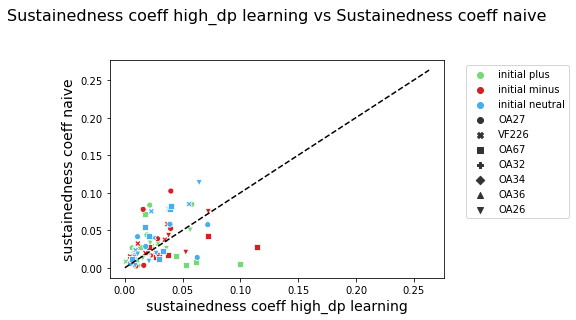

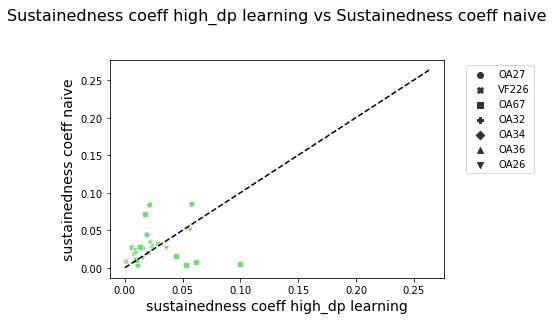

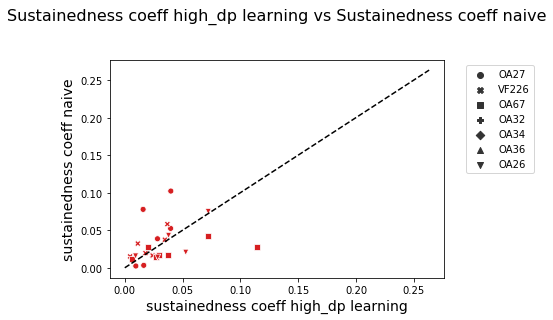

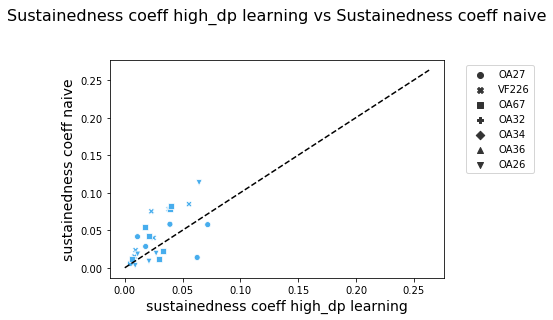

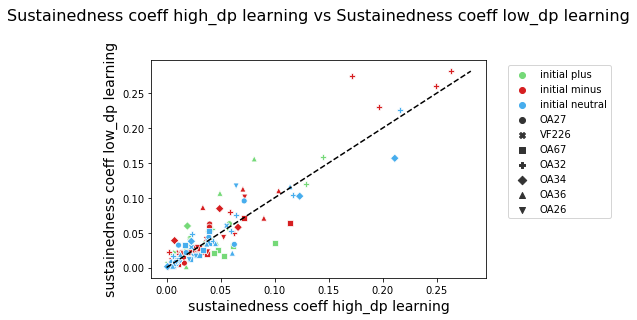

...

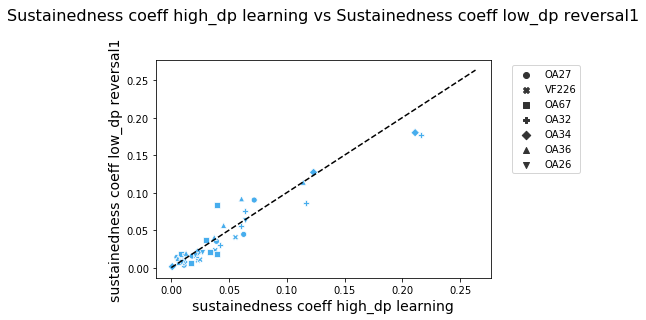

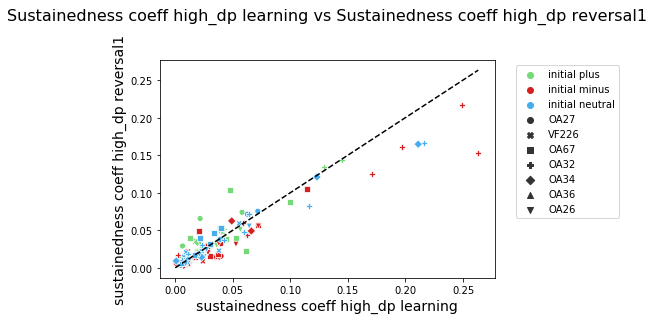

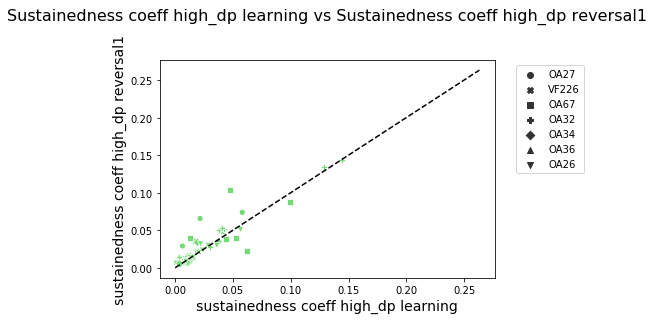

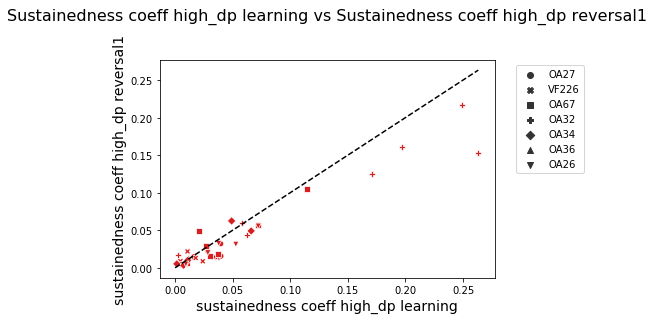

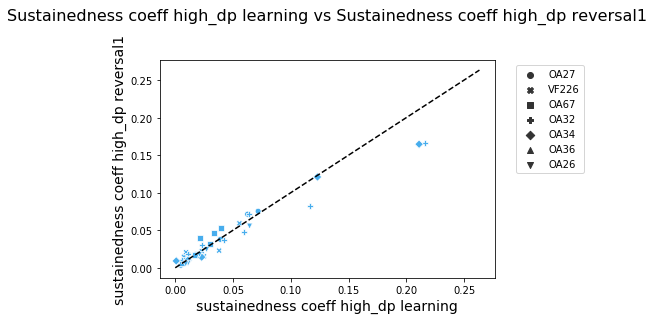

In [192]:
stages = ['naive', 'low_dp learning', 'high_dp learning', 'low_dp reversal1', 'high_dp reversal1']
folder = 'christina norep control sustainedness plots component thresh scatter'
tag = 'v1'
primary_stage = 'high_dp learning'
secondary_stages = [s for s in stages if s != primary_stage]

if not os.path.isdir(folder): os.mkdir(folder)
save_dir = os.path.join(folder, primary_stage)
if not os.path.isdir(save_dir): os.mkdir(save_dir)
    
for stages_to_comp in secondary_stages:
    plt.figure()
    # for ori in ['plus', 'minus', 'neutral']:
    #     ori_vec = total_sus.reset_index()['initial CS'].values
    # oriboo = ori_vec == 'initial {}'.format(ori)
    sns.scatterplot(x=total_sus[primary_stage].values, 
                    y=total_sus[stages_to_comp].values,
                    palette=hue_dict,
                    hue=total_sus.reset_index()['initial CS'].values,
                    style=total_sus.reset_index()['mouse'].values)
    xmax = np.nanmax(total_sus[primary_stage].values)
    ymax = np.nanmax(total_sus[stages_to_comp].values)
    maxval = np.nanmax([xmax, ymax])
    plt.plot([0, maxval], [0, maxval], 'k--')
    plt.xlabel(primary_stage)
    plt.ylabel(stages_to_comp)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.ylabel('sustainedness coeff {}'.format(stages_to_comp), size=14)
    plt.xlabel('sustainedness coeff {}'.format(primary_stage), size=14)
    plt.title('Sustainedness coeff {} vs Sustainedness coeff {}\n\n'.format(primary_stage, stages_to_comp), size=16)
    plt.savefig('.//{}//{}_{}_{}_sus_{}_v_{}.pdf'.format(save_dir, t_or_wa, tag, words[0], primary_stage, stages_to_comp),
                bbox_inches='tight')


    for ori in ['plus', 'minus', 'neutral']:
        plt.figure()
    #     f, ax = plt.subplots(figsize=(7, 7))
    #     ax.set(xscale="log", yscale="log")
        ori_vec = total_sus.reset_index()['initial CS'].values
        oriboo = ori_vec == 'initial {}'.format(ori)
        sns.scatterplot(x=total_sus[primary_stage].iloc[oriboo].values, 
                        y=total_sus[stages_to_comp].iloc[oriboo].values,
                        color=hue_dict['initial {}'.format(ori)],
                        style=total_sus.reset_index()['mouse'].iloc[oriboo].values)
        plt.plot([0, maxval], [0, maxval], 'k--')
    #     plt.yscale('log')
    #     plt.xscale('log')
    #     plt.ylim([-5, None])
    #     plt.xlim([-5, None])
        plt.xlabel(primary_stage)
        plt.ylabel(stages_to_comp)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.ylabel('sustainedness coeff {}'.format(stages_to_comp), size=14)
        plt.xlabel('sustainedness coeff {}'.format(primary_stage), size=14)
        plt.title('Sustainedness coeff {} vs Sustainedness coeff {}\n\n'.format(primary_stage, stages_to_comp), size=16)
        plt.savefig('.//{}//{}_{}_{}_sus_initial_{}_{}_v_{}.pdf'.format(save_dir, t_or_wa, tag, words[0], ori, primary_stage, stages_to_comp),
                    bbox_inches='tight')

# TRANS

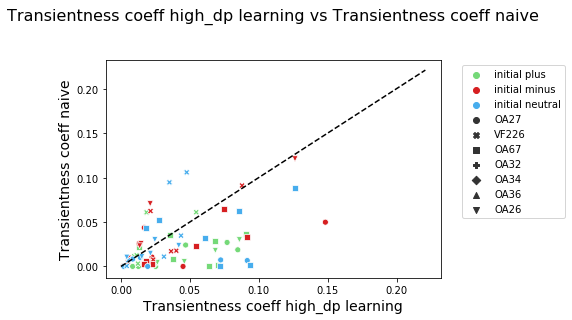

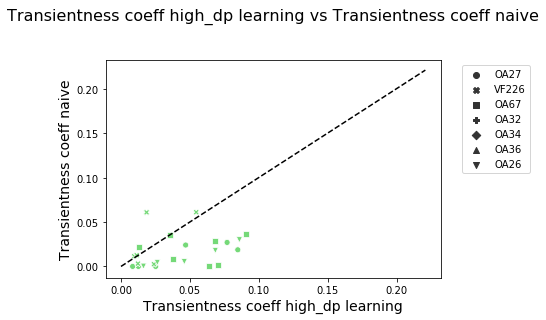

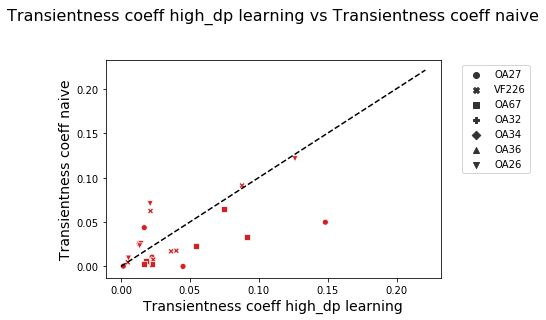

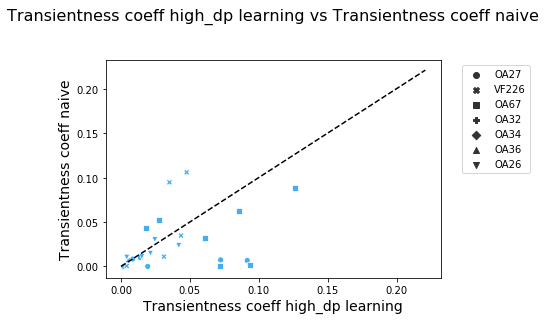

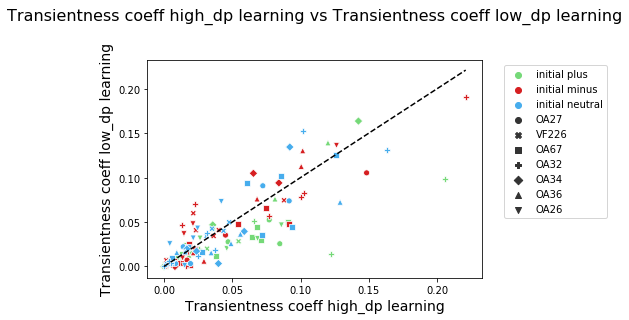

...

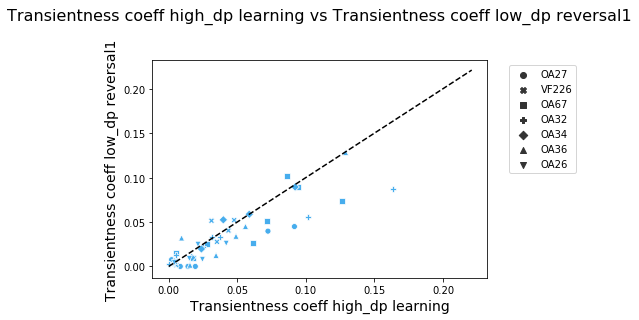

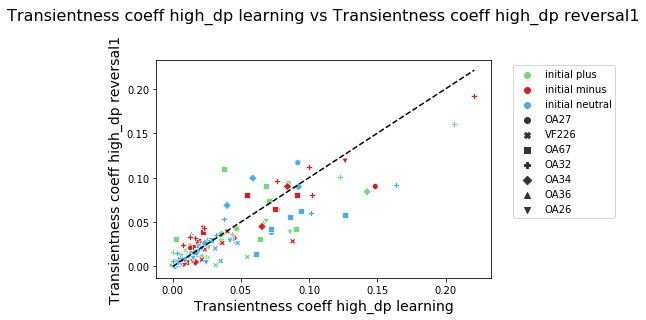

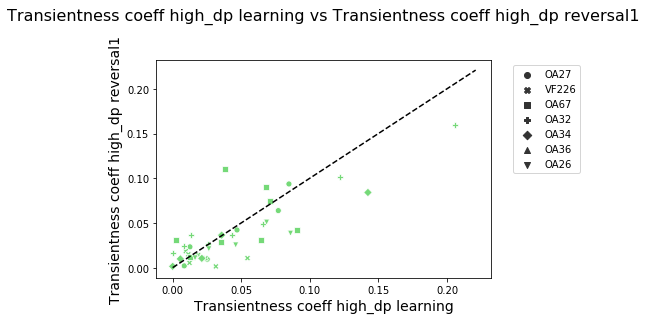

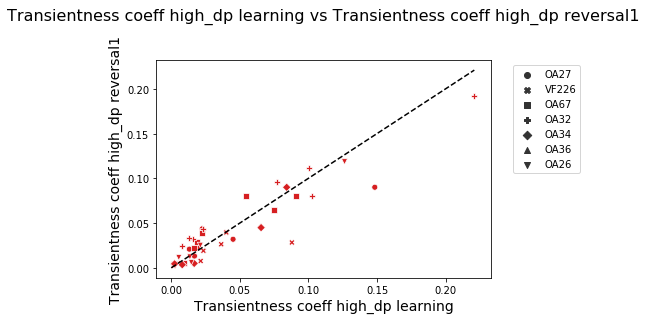

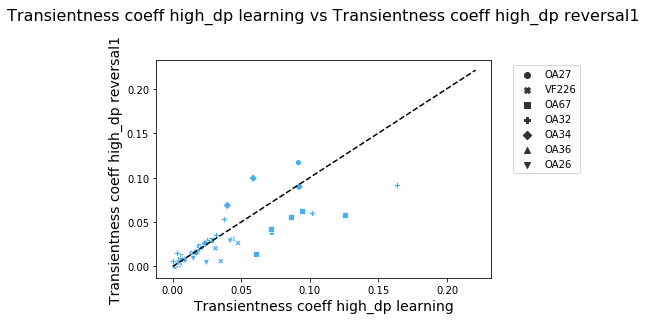

In [189]:
stages = ['naive', 'low_dp learning', 'high_dp learning', 'low_dp reversal1', 'high_dp reversal1']
folder = 'christina norep control transient plots component thresh scatter'
tag = 'v1'
primary_stage = 'high_dp learning'
secondary_stages = [s for s in stages if s != primary_stage]

if not os.path.isdir(folder): os.mkdir(folder)
save_dir = os.path.join(folder, primary_stage)
if not os.path.isdir(save_dir): os.mkdir(save_dir)
    
for stages_to_comp in secondary_stages:
    plt.figure()
    # for ori in ['plus', 'minus', 'neutral']:
    #     ori_vec = total_sus.reset_index()['initial CS'].values
    # oriboo = ori_vec == 'initial {}'.format(ori)
    sns.scatterplot(x=total_sus[primary_stage].values, 
                    y=total_sus[stages_to_comp].values,
                    palette=hue_dict,
                    hue=total_sus.reset_index()['initial CS'].values,
                    style=total_sus.reset_index()['mouse'].values)
    xmax = np.nanmax(total_sus[primary_stage].values)
    ymax = np.nanmax(total_sus[stages_to_comp].values)
    maxval = np.nanmax([xmax, ymax])
    plt.plot([0, maxval], [0, maxval], 'k--')
    plt.xlabel(primary_stage)
    plt.ylabel(stages_to_comp)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.ylabel('Transientness coeff {}'.format(stages_to_comp), size=14)
    plt.xlabel('Transientness coeff {}'.format(primary_stage), size=14)
    plt.title('Transientness coeff {} vs Transientness coeff {}\n\n'.format(primary_stage, stages_to_comp), size=16)
    plt.savefig('.//{}//{}_{}_{}_trans_{}_v_{}.pdf'.format(save_dir, t_or_wa, tag, words[0], primary_stage, stages_to_comp),
                bbox_inches='tight')


    for ori in ['plus', 'minus', 'neutral']:
        plt.figure()
    #     f, ax = plt.subplots(figsize=(7, 7))
    #     ax.set(xscale="log", yscale="log")
        ori_vec = total_sus.reset_index()['initial CS'].values
        oriboo = ori_vec == 'initial {}'.format(ori)
        sns.scatterplot(x=total_sus[primary_stage].iloc[oriboo].values, 
                        y=total_sus[stages_to_comp].iloc[oriboo].values,
                        color=hue_dict['initial {}'.format(ori)],
                        style=total_sus.reset_index()['mouse'].iloc[oriboo].values)
        plt.plot([0, maxval], [0, maxval], 'k--')
    #     plt.yscale('log')
    #     plt.xscale('log')
    #     plt.ylim([-5, None])
    #     plt.xlim([-5, None])
        plt.xlabel(primary_stage)
        plt.ylabel(stages_to_comp)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.ylabel('Transientness coeff {}'.format(stages_to_comp), size=14)
        plt.xlabel('Transientness coeff {}'.format(primary_stage), size=14)
        plt.title('Transientness coeff {} vs Transientness coeff {}\n\n'.format(primary_stage, stages_to_comp), size=16)
        plt.savefig('.//{}//{}_{}_{}_trans_initial_{}_{}_v_{}.pdf'.format(save_dir, t_or_wa, tag, words[0], ori, primary_stage, stages_to_comp),
                    bbox_inches='tight')

Text(0.5, 1.0, 'Average sustainedness for component-groups >0.5 SI high dp learning\n')

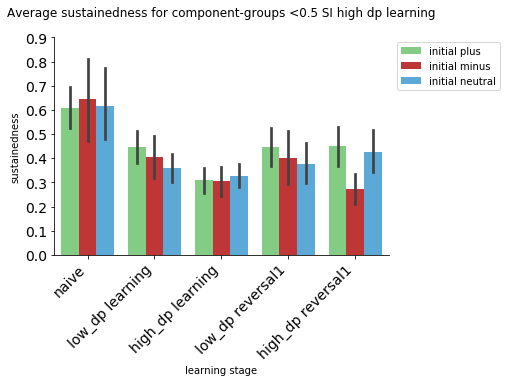

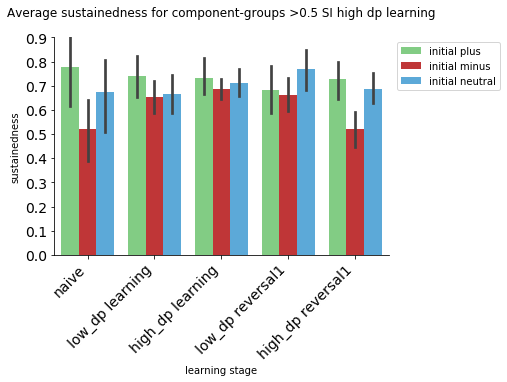

In [44]:

plt.figure()
filter_sus = total_sus.loc[total_sus['high_dp learning'].lt(0.5), :]
# filter_sus = total_sus.loc[total_sus['high_dp learning'].gt(0.5), :]
test = filter_sus.stack()
new_df = test.to_frame().reset_index()
mapper = {'level_3': 'learning stage', 0: 'sustainedness'}
new_stage_df = new_df.rename(columns=mapper)

hue_dict = {}
for ori in ['plus', 'minus', 'neutral']:
    hue_dict['initial {}'.format(ori)] = color_dict[ori]

sns.barplot(x='learning stage', y='sustainedness', data=new_stage_df, hue='initial CS', palette=hue_dict)
plt.xticks(rotation=45, ha='right', size=14)
plt.yticks(size=14)
plt.ylim([0, 0.9])
# plt.ylabel(size=16)
# plt.xlabel(size=16)
sns.despine()
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.title('Average sustainedness for component-groups <0.5 SI high dp learning\n')
# sns.lineplot(data=new_stage_df, y='sustainedness', x='learning stage', hue='initial CS')

plt.figure()
# filter_sus = total_sus.loc[total_sus['high_dp learning'].lt(0.5), :]
filter_sus = total_sus.loc[total_sus['high_dp learning'].gt(0.5), :]
test = filter_sus.stack()
new_df = test.to_frame().reset_index()
mapper = {'level_3': 'learning stage', 0: 'sustainedness'}
new_stage_df = new_df.rename(columns=mapper)

hue_dict = {}
for ori in ['plus', 'minus', 'neutral']:
    hue_dict['initial {}'.format(ori)] = color_dict[ori]

sns.barplot(x='learning stage', y='sustainedness', data=new_stage_df, hue='initial CS', palette=hue_dict)
plt.xticks(rotation=45, ha='right', size=14)
plt.yticks(size=14)
plt.ylim([0, 0.9])
# plt.ylabel(size=16)
# plt.xlabel(size=16)
sns.despine()
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.title('Average sustainedness for component-groups >0.5 SI high dp learning\n')

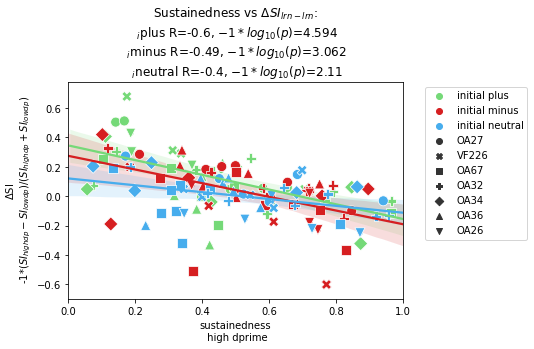

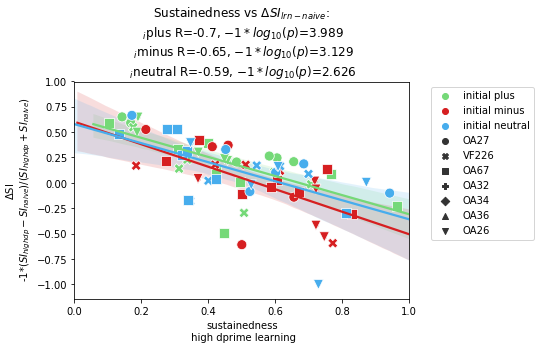

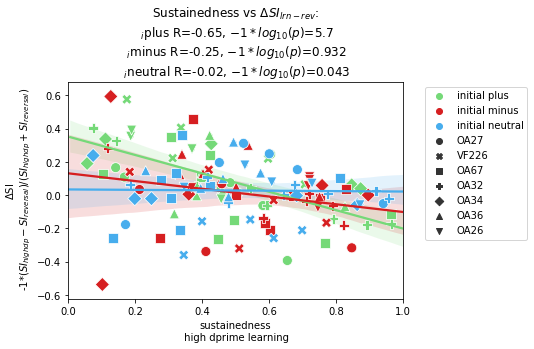

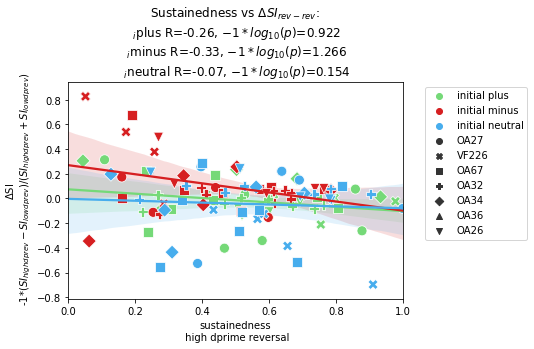

In [291]:
folder = 'Sustainedness index plots daily thresh fit on means grouped PMN'
# folder = 'Sustainedness index plots daily thresh mean of trials fits'
if not os.path.isdir(folder): os.mkdir(folder)
save_dir = os.path.join(folder, 'Sustainedness plots christina ylim')
if not os.path.isdir(save_dir): os.mkdir(save_dir)
tag = 'v1'

hue_dict = {}
for ori in ['plus', 'minus', 'neutral']:
    hue_dict['initial {}'.format(ori)] = color_dict[ori]

plt.figure()
dsus = ((total_sus['high_dp learning'] - total_sus['low_dp learning'])*-1)/(total_sus['high_dp learning'] + total_sus['low_dp learning'])
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{low dp})/(SI_{high dp}+SI_{low dp}$)')
plt.xlabel('sustainedness\n high dprime')
plt.title('Sustainedness vs $\Delta$$SI_{lrn-lrn}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_learnldp.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

plt.figure()
dsus = ((total_sus['high_dp learning'] - total_sus['naive'])*-1)/(total_sus['high_dp learning'] + total_sus['naive'])
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{naive})/(SI_{high dp}+SI_{naive}$)')
plt.xlabel('sustainedness\n high dprime learning')
plt.title('Sustainedness vs $\Delta$$SI_{lrn-naive}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_naive.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

plt.figure()
dsus = ((total_sus['high_dp learning'] - total_sus['low_dp reversal1'])*-1)/(total_sus['high_dp learning'] + total_sus['low_dp reversal1'])
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{reversal})/(SI_{high dp}+SI_{reversal}$)')
plt.xlabel('sustainedness\n high dprime learning')
plt.title('Sustainedness vs $\Delta$$SI_{lrn-rev}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_revldp.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

plt.figure()
dsus = ((total_sus['high_dp reversal1'] - total_sus['low_dp reversal1'])*-1)/(total_sus['high_dp reversal1'] + total_sus['low_dp reversal1'])
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp reversal1'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp reversal1'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp reversal1'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp reversal1'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n -1*($SI_{high dp rev}-SI_{low dp rev})/(SI_{high dp rev}+SI_{low dp rev}$)')
plt.xlabel('sustainedness\n high dprime reversal')
plt.title('Sustainedness vs $\Delta$$SI_{rev-rev}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_revhdp_v_revldp.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

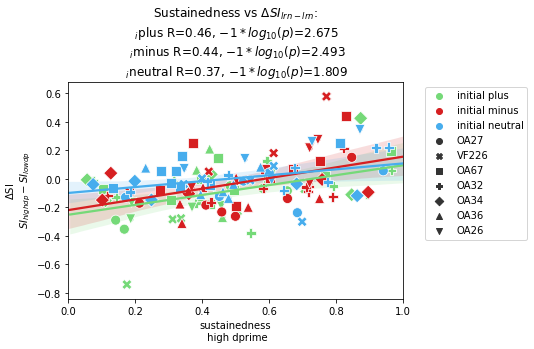

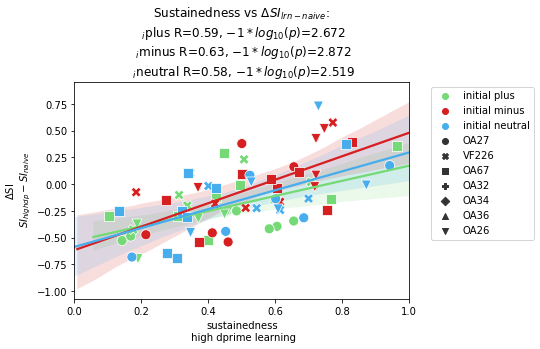

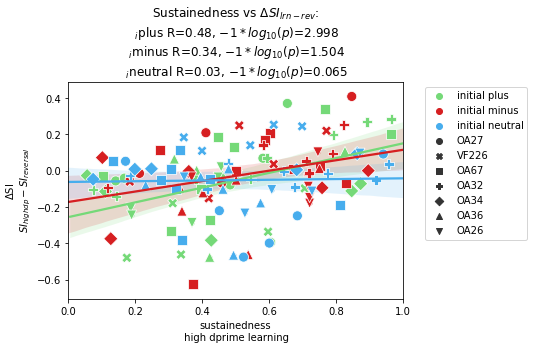

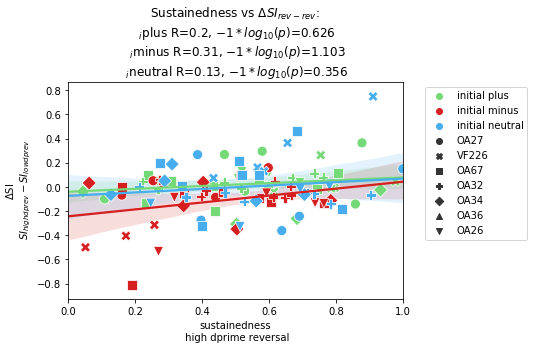

In [364]:
folder = 'Sustainedness index plots daily thresh fit on means grouped PMN'
# folder = 'Sustainedness index plots daily thresh mean of trials fits'
if not os.path.isdir(folder): os.mkdir(folder)
save_dir = os.path.join(folder, 'Sustainedness plots christina ylim')
if not os.path.isdir(save_dir): os.mkdir(save_dir)
tag = 'v2'

hue_dict = {}
for ori in ['plus', 'minus', 'neutral']:
    hue_dict['initial {}'.format(ori)] = color_dict[ori]

plt.figure()
dsus = total_sus['high_dp learning'] - total_sus['low_dp learning']
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{low dp}$')
plt.xlabel('sustainedness\n high dprime')
plt.title('Sustainedness vs $\Delta$$SI_{lrn-lrn}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_learnldp.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

plt.figure()
dsus = total_sus['high_dp learning'] - total_sus['naive']
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{naive}$')
plt.xlabel('sustainedness\n high dprime learning')
plt.title('Sustainedness vs $\Delta$$SI_{lrn-naive}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_naive.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

plt.figure()
dsus = total_sus['high_dp learning'] - total_sus['low_dp reversal1']
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{reversal}$')
plt.xlabel('sustainedness\n high dprime learning')
plt.title('Sustainedness vs $\Delta$$SI_{lrn-rev}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_revldp.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

plt.figure()
dsus = total_sus['high_dp reversal1'] - total_sus['low_dp reversal1']
ori_vec = total_sus.reset_index()['initial CS'].values
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp reversal1'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp reversal1'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
sns.scatterplot(x=total_sus['high_dp reversal1'], y=tester['delta_sus'], s=100,
                hue=total_sus.reset_index()['initial CS'].values, palette=hue_dict,
                style=total_sus.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim([0, 1])
# plt.ylim([-1, 1])
keep_bool = ~np.isnan(tester['delta_sus'])
rs, ps = [], []
for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    r = sp.stats.pearsonr(total_sus['high_dp reversal1'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
    ps.append(r[1])
    rs.append(r[0])
plt.ylabel('$\Delta$SI\n $SI_{high dp rev}-SI_{low dp rev}$')
plt.xlabel('sustainedness\n high dprime reversal')
plt.title('Sustainedness vs $\Delta$$SI_{rev-rev}$'
          + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
          + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
          + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
         )
plt.savefig('.//{}//{}_{}_{}_SI_revhdp_v_revldp.pdf'.format(folder, t_or_wa, tag, words[0]), bbox_inches='tight')

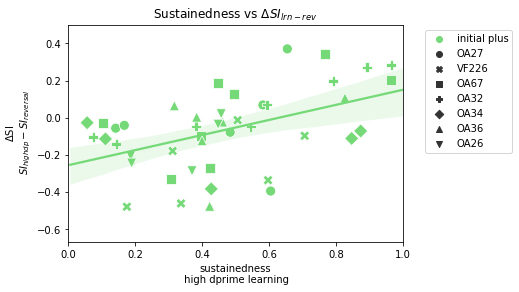

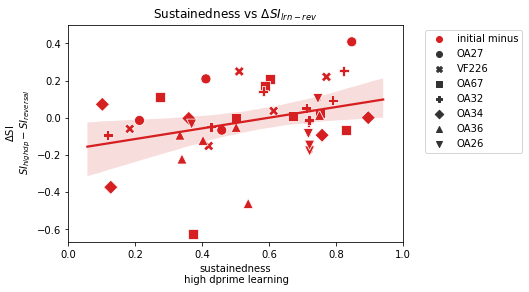

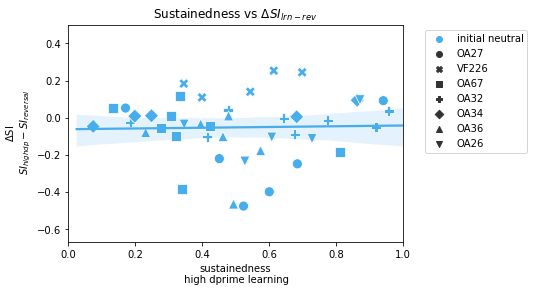

In [366]:
for ori in ['plus', 'minus', 'neutral']:
    plt.figure()
    dsus = total_sus['high_dp learning'] - total_sus['low_dp reversal1']
    ori_vec = total_sus.reset_index()['initial CS'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
    # for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
    sns.scatterplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], s=100,
                    hue=total_sus.iloc[oriboo, :].reset_index()['initial CS'].values, palette=hue_dict,
                    style=total_sus.iloc[oriboo, :].reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    plt.ylim([-0.67, 0.5])
    keep_bool = ~np.isnan(tester['delta_sus'])
    rs, ps = [], []
#     for ori in ['plus', 'minus', 'neutral']:
#         oriboo = ori_vec == 'initial {}'.format(ori)
#         r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
#         ps.append(r[1])
#         rs.append(r[0])
    plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{reversal}$')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('Sustainedness vs $\Delta$$SI_{lrn-rev}$'
#               + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
#               + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
#               + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
             )
#     plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_revldp_{}.pdf'.format(folder, t_or_wa, tag, words[0], ori), bbox_inches='tight')




In [452]:
# working on regression to the mean

ori_bounds = {}
for ori in ['plus', 'minus', 'neutral']:
    plt.figure()
    
    ori_vec = total_sus.reset_index()['initial CS'].values
    oriboo = ori_vec == 'initial {}'.format(ori)
    
    # shuffle fit
    shuff_dsus = []
    shuff_sus = []
    shuff_oriboo = []
    sz = len(total_sus['low_dp reversal1'].values)
    for booti in range(1000):
        rand_inds = np.random.permutation(sz)
        shuff_dsus.extend(deepcopy(total_sus['high_dp learning']).values - deepcopy(total_sus['low_dp reversal1']).values[rand_inds])
        shuff_sus.extend(deepcopy(total_sus['high_dp learning']).values)
        shuff_oriboo.extend(oriboo)
    shuff_dsus = np.array(shuff_dsus)
    shuff_sus = np.array(shuff_sus)
    shuff_oriboo = np.array(shuff_oriboo)
    sig_vec = np.zeros(len(total_sus['high_dp learning'].values))
    bounds = []
    for ic, isus in enumerate(total_sus['high_dp learning'].values):
        if np.isnan(isus):
            bounds.append([np.nan, np.nan, np.nan])
            sig_vec[ic] = 1
            continue
#         iboo = shuff_sus == isus
        nboo = np.arange(ic*len(total_sus['high_dp learning'].values), len(shuff_sus), len(total_sus['high_dp learning'].values))
        sorted_dsus = np.sort(shuff_dsus[nboo])
        sorted_dsus = sorted_dsus[~np.isnan(sorted_dsus)]
        straps = len(sorted_dsus)
        lower = sorted_dsus[int(np.floor(straps*.05))]
        upper = sorted_dsus[int(np.floor(straps*.95))]
        bounds.append([total_sus['high_dp learning'].values[ic], lower, upper])
        if (total_sus['high_dp learning'].values[ic] > lower) and (total_sus['high_dp learning'].values[ic] < upper):
            sig_vec[ic] = 1
            
    ori_bounds[ori] = np.vstack(bounds)[oriboo, :]
    print(np.sum(sig_vec))
    x_shuff = shuff_sus[shuff_oriboo]
    y_shuff = shuff_dsus[shuff_oriboo]
    sns.regplot(x=x_shuff, y=y_shuff, marker='.', color=color_dict['gray'], scatter_kws={'alpha': 0.01}, dropna=True)
    
    # data fit
    dsus = deepcopy(total_sus['high_dp learning']) - deepcopy(total_sus['low_dp reversal1'])
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=regori, y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
    
    # annotated scatterplot
    sns.scatterplot(x=regori, y=regtester['delta_sus'], s=100,
                    hue=total_sus.iloc[oriboo, :].reset_index()['initial CS'].values, palette=hue_dict,
                    style=total_sus.iloc[oriboo, :].reset_index()['mouse'].values)
    
    # annotated scatterplot
    sig_boo = sig_vec > 0
    bad_color = {'initial plus': color_dict['gray'], 'initial minus': color_dict['gray'], 'initial neutral': color_dict['gray']}
    sns.scatterplot(x=total_sus['high_dp learning'].iloc[sig_boo & oriboo], y=tester['delta_sus'].iloc[sig_boo & oriboo], s=100,
                    hue=total_sus.iloc[sig_boo & oriboo, :].reset_index()['initial CS'].values, palette=bad_color,
                    style=total_sus.iloc[sig_boo & oriboo, :].reset_index()['mouse'].values)
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    plt.ylim([-0.67, 0.5])
    keep_bool = ~np.isnan(tester['delta_sus'])
    rs, ps = [], []
#     for ori in ['plus', 'minus', 'neutral']:
#         oriboo = ori_vec == 'initial {}'.format(ori)
#         r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
#         ps.append(r[1])
#         rs.append(r[0])
    plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{reversal}$')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('Sustainedness vs $\Delta$$SI_{lrn-rev}$')
#               + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
#               + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
#               + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
        
#     plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_revldp_{}_boot.pdf'.format(folder, t_or_wa, tag, words[0], ori), bbox_inches='tight')



IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 432x288 with 0 Axes>

In [457]:
# working on regression to the mean

ori_bounds = {}
for ori in ['plus', 'minus', 'neutral']:
    plt.figure()
    
    ori_vec = total_sus.reset_index()['initial CS'].values
    oriboo = ori_vec == 'initial {}'.format(ori)
    
    # shuffle fit
    shuff_dsus = []
    shuff_sus = []
    shuff_oriboo = []
    sz = len(total_sus['low_dp reversal1'].values)
    boots = np.zeros((sz, 1000))
    for booti in range(1000):
        rand_inds = np.random.permutation(sz)
        shuff_dsus.extend(deepcopy(total_sus['high_dp learning']).values - deepcopy(total_sus['low_dp reversal1']).values[rand_inds])
        shuff_sus.extend(deepcopy(total_sus['high_dp learning']).values)
        shuff_oriboo.extend(oriboo)
        boots[:, booti] = deepcopy(total_sus['high_dp learning']).values - deepcopy(total_sus['low_dp reversal1']).values[rand_inds]
    shuff_dsus = np.array(shuff_dsus)
    shuff_sus = np.array(shuff_sus)
    shuff_oriboo = np.array(shuff_oriboo)
    sig_vec = np.zeros(len(total_sus['high_dp learning'].values))
    bounds = []
    break 
    for ic, isus in enumerate(total_sus['high_dp learning'].values):
        if np.isnan(isus):
            bounds.append([np.nan, np.nan, np.nan])
            sig_vec[ic] = 1
            continue
#         iboo = shuff_sus == isus
        nboo = np.arange(ic*len(total_sus['high_dp learning'].values), len(shuff_sus), len(total_sus['high_dp learning'].values))
        sorted_dsus = np.sort(shuff_dsus[nboo])
        sorted_dsus = sorted_dsus[~np.isnan(sorted_dsus)]
        straps = len(sorted_dsus)
        lower = sorted_dsus[int(np.floor(straps*.05))]
        upper = sorted_dsus[int(np.floor(straps*.95))]
        bounds.append([total_sus['high_dp learning'].values[ic], lower, upper])
        if (total_sus['high_dp learning'].values[ic] > lower) and (total_sus['high_dp learning'].values[ic] < upper):
            sig_vec[ic] = 1
            
    ori_bounds[ori] = np.vstack(bounds)[oriboo, :]
    print(np.sum(sig_vec))
    x_shuff = shuff_sus[shuff_oriboo]
    y_shuff = shuff_dsus[shuff_oriboo]
    sns.regplot(x=x_shuff, y=y_shuff, marker='.', color=color_dict['gray'], scatter_kws={'alpha': 0.01}, dropna=True)
    
    # data fit
    dsus = deepcopy(total_sus['high_dp learning']) - deepcopy(total_sus['low_dp reversal1'])
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=regori, y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
    
    # annotated scatterplot
    sns.scatterplot(x=regori, y=regtester['delta_sus'], s=100,
                    hue=total_sus.iloc[oriboo, :].reset_index()['initial CS'].values, palette=hue_dict,
                    style=total_sus.iloc[oriboo, :].reset_index()['mouse'].values)
    
    # annotated scatterplot
    sig_boo = sig_vec > 0
    bad_color = {'initial plus': color_dict['gray'], 'initial minus': color_dict['gray'], 'initial neutral': color_dict['gray']}
    sns.scatterplot(x=total_sus['high_dp learning'].iloc[sig_boo & oriboo], y=tester['delta_sus'].iloc[sig_boo & oriboo], s=100,
                    hue=total_sus.iloc[sig_boo & oriboo, :].reset_index()['initial CS'].values, palette=bad_color,
                    style=total_sus.iloc[sig_boo & oriboo, :].reset_index()['mouse'].values)
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    plt.ylim([-0.67, 0.5])
    keep_bool = ~np.isnan(tester['delta_sus'])
    rs, ps = [], []
#     for ori in ['plus', 'minus', 'neutral']:
#         oriboo = ori_vec == 'initial {}'.format(ori)
#         r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
#         ps.append(r[1])
#         rs.append(r[0])
    plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{reversal}$')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('Sustainedness vs $\Delta$$SI_{lrn-rev}$')
#               + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
#               + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
#               + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
        
#     plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_revldp_{}_boot.pdf'.format(folder, t_or_wa, tag, words[0], ori), bbox_inches='tight')




<Figure size 432x288 with 0 Axes>

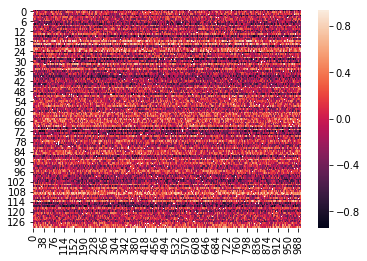

In [462]:
# np.vstack(bounds).shape
# len(total_sus['high_dp learning'].values)
# len(np.arange(ic*len(total_sus['high_dp learning'].values), len(shuff_sus), len(total_sus['high_dp learning'].values)))
sns.heatmap(boots[~np.isnan(total_sus['high_dp learning'].values), :])

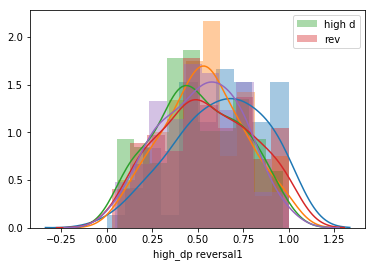

In [384]:
sns.distplot(total_sus['naive'].dropna(), 10)
sns.distplot(total_sus['low_dp learning'].dropna(), 10)
sns.distplot(total_sus['high_dp learning'].dropna(), 10, label='high d''')
sns.distplot(total_sus['low_dp reversal1'].dropna(), 10, label='rev')
sns.distplot(total_sus['high_dp reversal1'].dropna(), 10)
plt.legend()

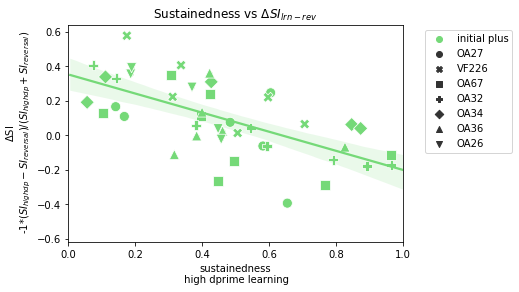

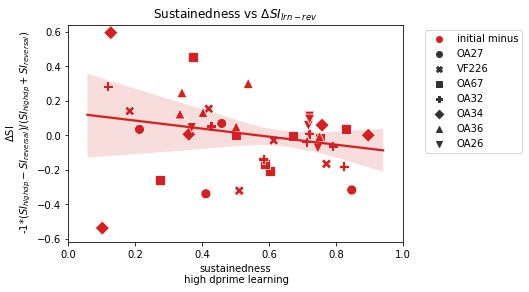

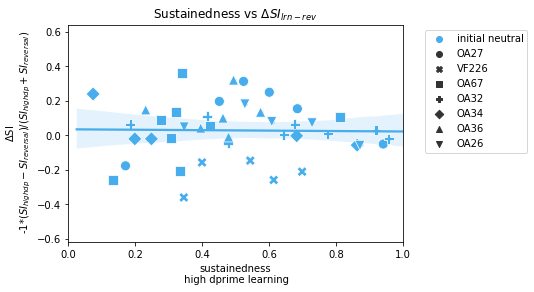

In [341]:
for ori in ['plus', 'minus', 'neutral']:
    plt.figure()
    dsus = ((total_sus['high_dp learning'] - total_sus['low_dp reversal1'])*-1)/(total_sus['high_dp learning'] + total_sus['low_dp reversal1'])
    ori_vec = total_sus.reset_index()['initial CS'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=total_sus.index)
    # for ori in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(ori)
    regtester = tester.iloc[oriboo]
    regori = total_sus['high_dp learning'].iloc[oriboo]
    sns.regplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', color=color_dict[ori], dropna=True)
    sns.scatterplot(x=total_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], s=100,
                    hue=total_sus.iloc[oriboo, :].reset_index()['initial CS'].values, palette=hue_dict,
                    style=total_sus.iloc[oriboo, :].reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    plt.ylim([-0.62, 0.64])
    keep_bool = ~np.isnan(tester['delta_sus'])
    rs, ps = [], []
#     for ori in ['plus', 'minus', 'neutral']:
#         oriboo = ori_vec == 'initial {}'.format(ori)
#         r = sp.stats.pearsonr(total_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
#         ps.append(r[1])
#         rs.append(r[0])
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{reversal})/(SI_{high dp}+SI_{reversal}$)')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('Sustainedness vs $\Delta$$SI_{lrn-rev}$'
#               + ':\n $_i$plus R={}, {}={}'.format(round(rs[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[0]), 3))
#               + '\n $_i$minus R={}, {}={}'.format(round(rs[1], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[1]), 3))
#               + '\n $_i$neutral R={}, {}={}'.format(round(rs[2], 2), '$-1*log_{10}(p)$', round(-1*np.log10(ps[2]), 3))
             )
    plt.savefig('.//{}//{}_{}_{}_SI_learnhdp_v_revldp_{}.pdf'.format(folder, t_or_wa, tag, words[0], ori), bbox_inches='tight')



D:\Anaconda3\lib\site-packages\scipy\stats\stats.py:3033: RuntimeWarning: Mean of empty slice.
  mx = x.mean()
D:\Anaconda3\lib\site-packages\scipy\stats\stats.py:3034: RuntimeWarning: Mean of empty slice.
  my = y.mean()


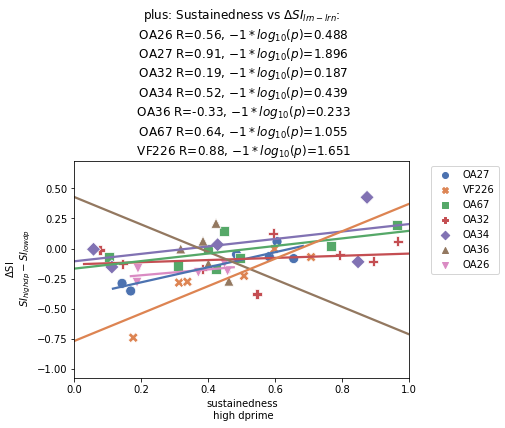

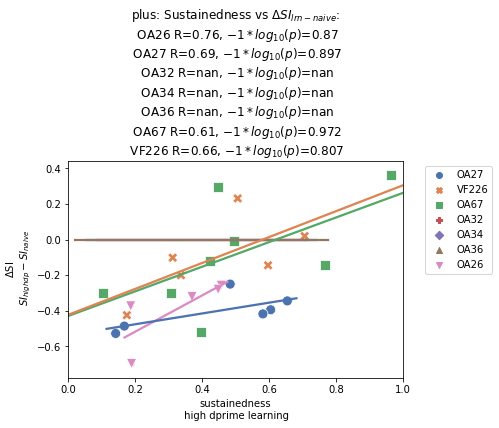

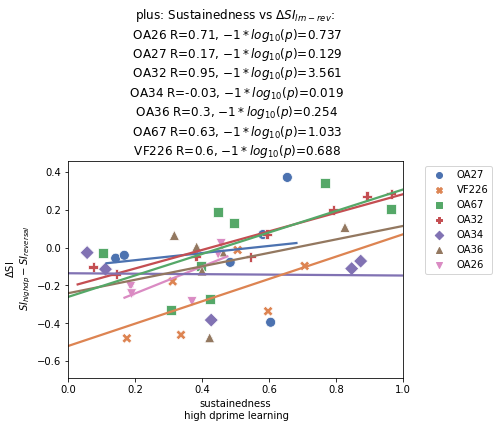

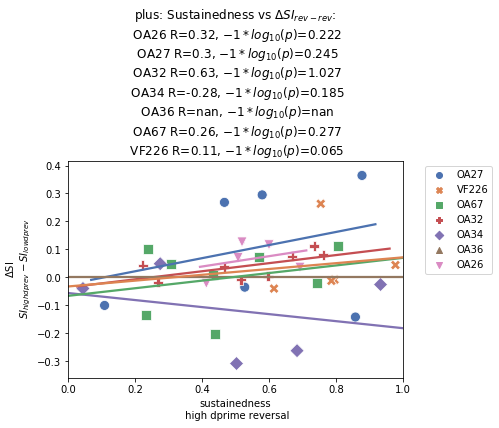

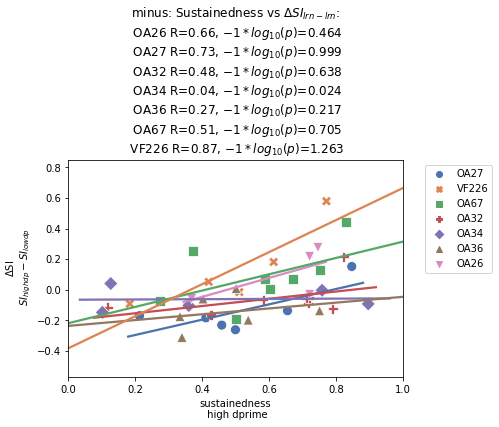

...

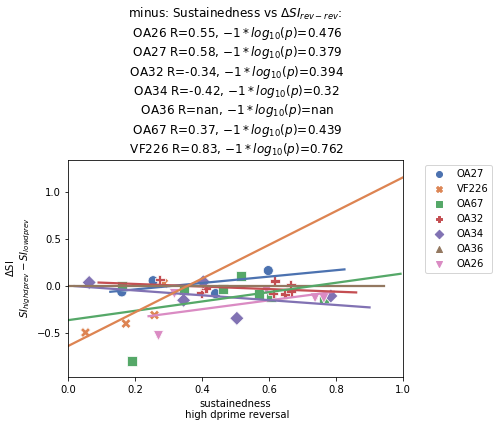

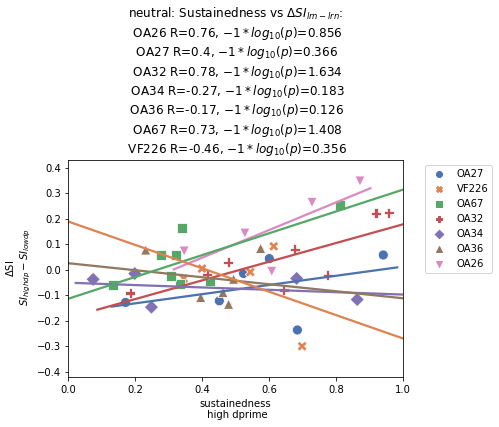

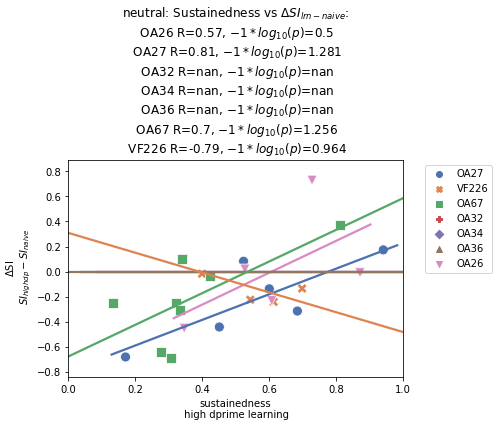

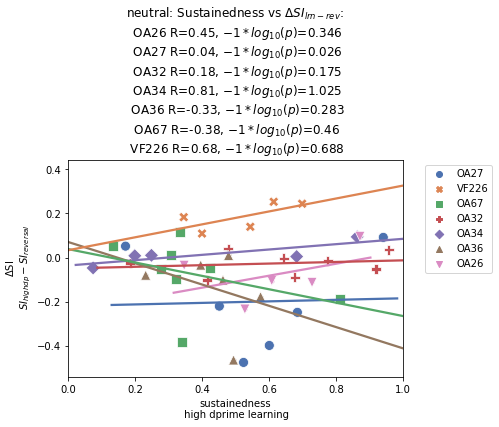

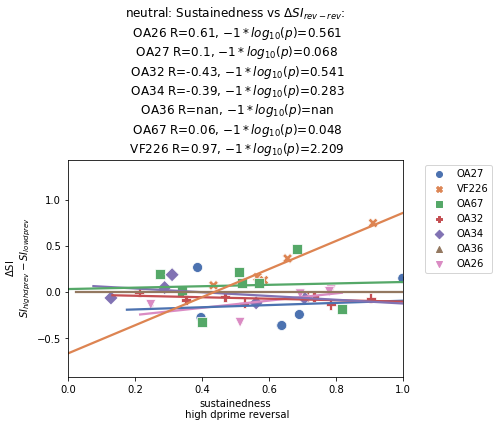

In [45]:
folder = 'Sustainedness index plots daily thresh fit on means grouped by mouse'
# folder = 'Sustainedness index plots daily thresh mean of trials fits'
if not os.path.isdir(folder): os.mkdir(folder)
# save_dir = os.path.join(folder, 'Sustainedness plots christina ylim')
# if not os.path.isdir(save_dir): os.mkdir(save_dir)
tag = 'v2_per_mouse'
save_please = True
cmap = sns.color_palette('deep', 7)

hue_dict = {}
mouse_vec = total_sus.reset_index()['mouse'].unique()
for ms, cm in zip(mouse_vec, cmap):
    hue_dict[ms] = cm

ori_vec = total_sus.reset_index()['initial CS'].values
for cs in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(cs)
    ori_sus = total_sus.iloc[oriboo, :]
    
    plt.figure()
    dsus = ori_sus['high_dp learning'] - ori_sus['low_dp learning']
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp learning'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{low dp}$')
    plt.xlabel('sustainedness\n high dprime')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{lrn-lrn}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_learnhdp_v_learnldp.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

    plt.figure()
    dsus = ori_sus['high_dp learning'] - ori_sus['naive']
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp learning'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{naive}$')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{lrn-naive}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_learnhdp_v_naive.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

    plt.figure()
    dsus = ori_sus['high_dp learning'] - ori_sus['low_dp reversal1']
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp learning'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n $SI_{high dp}-SI_{reversal}$')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{lrn-rev}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_learnhdp_v_revldp.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

    plt.figure()
    dsus = ori_sus['high_dp reversal1'] - ori_sus['low_dp reversal1']
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp reversal1'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp reversal1'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp reversal1'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp reversal1'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n $SI_{high dp rev}-SI_{low dp rev}$')
    plt.xlabel('sustainedness\n high dprime reversal')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{rev-rev}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_revhdp_v_revldp.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

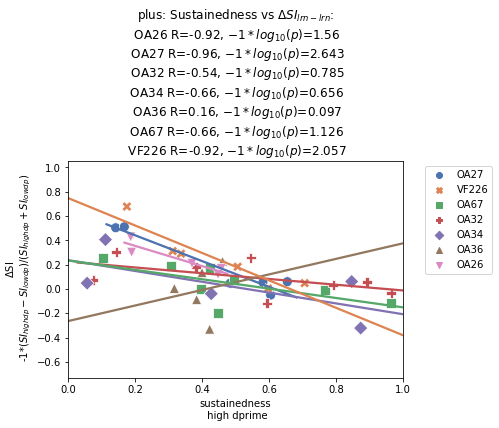

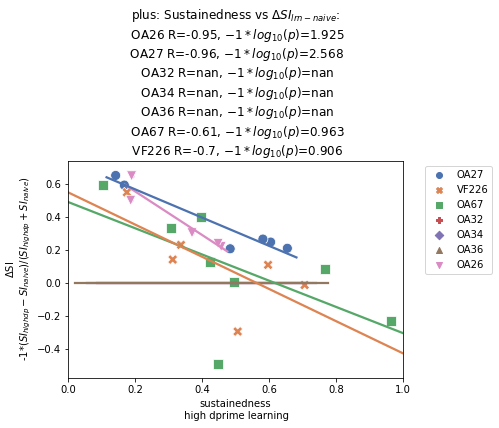

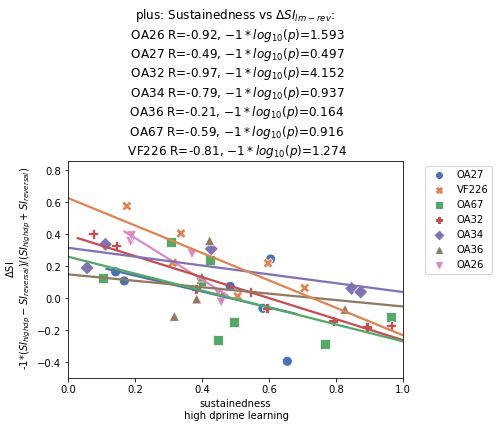

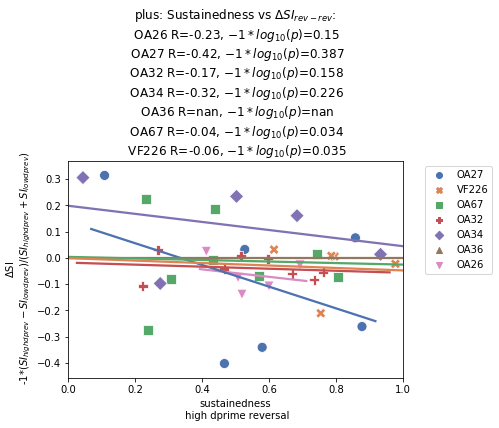

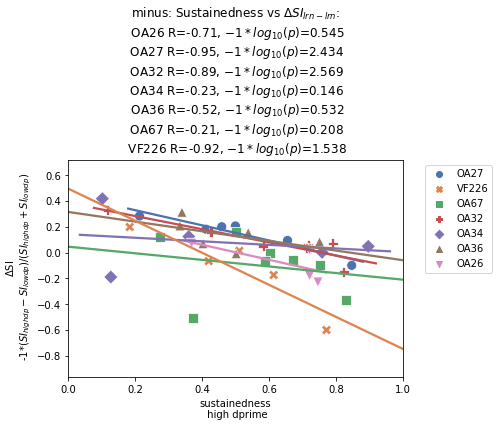

...

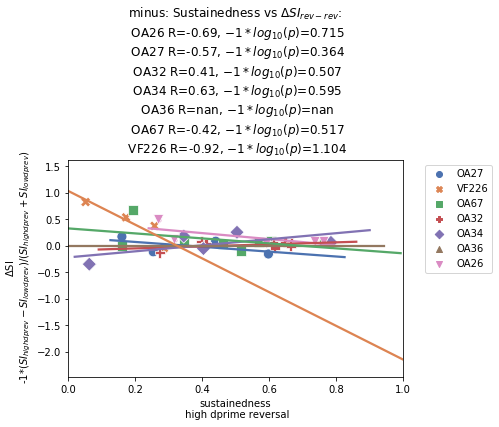

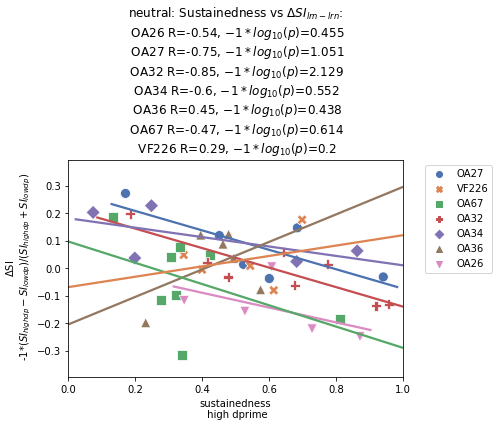

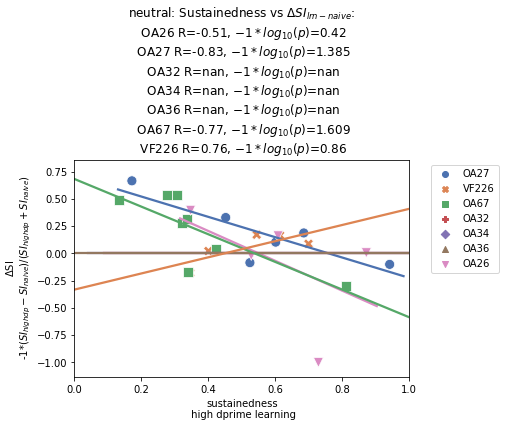

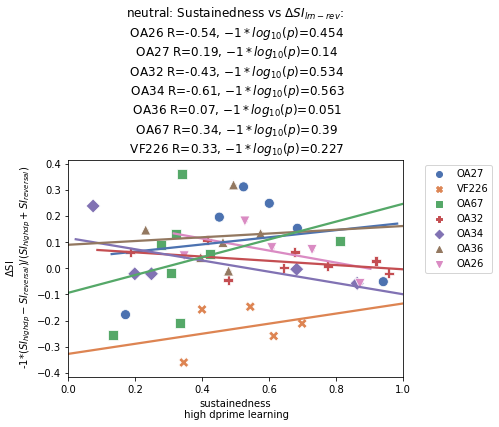

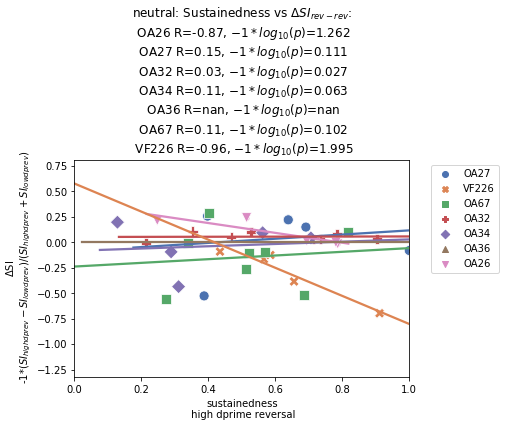

In [177]:
folder = 'Sustainedness index plots daily thresh fit on means grouped by mouse'
# folder = 'Sustainedness index plots daily thresh mean of trials fits'
if not os.path.isdir(folder): os.mkdir(folder)
# save_dir = os.path.join(folder, 'Sustainedness plots christina ylim')
# if not os.path.isdir(save_dir): os.mkdir(save_dir)
tag = 'v1_per_mouse'
save_please = True
cmap = sns.color_palette('deep', 7)

hue_dict = {}
mouse_vec = total_sus.reset_index()['mouse'].unique()
for ms, cm in zip(mouse_vec, cmap):
    hue_dict[ms] = cm

ori_vec = total_sus.reset_index()['initial CS'].values
for cs in ['plus', 'minus', 'neutral']:
    oriboo = ori_vec == 'initial {}'.format(cs)
    ori_sus = total_sus.iloc[oriboo, :]
    
    plt.figure()
    dsus = ((ori_sus['high_dp learning'] - ori_sus['low_dp learning'])*-1)/(ori_sus['high_dp learning'] + ori_sus['low_dp learning'])
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp learning'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{low dp})/(SI_{high dp}+SI_{low dp}$)')
    plt.xlabel('sustainedness\n high dprime')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{lrn-lrn}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_learnhdp_v_learnldp.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

    plt.figure()
    dsus = ((ori_sus['high_dp learning'] - ori_sus['naive'])*-1)/(ori_sus['high_dp learning'] + ori_sus['naive'])
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp learning'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{naive})/(SI_{high dp}+SI_{naive}$)')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{lrn-naive}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_learnhdp_v_naive.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

    plt.figure()
    dsus = ((ori_sus['high_dp learning'] - ori_sus['low_dp reversal1'])*-1)/(ori_sus['high_dp learning'] + ori_sus['low_dp reversal1'])
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp learning'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp learning'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp learning'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{reversal})/(SI_{high dp}+SI_{reversal}$)')
    plt.xlabel('sustainedness\n high dprime learning')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{lrn-rev}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_learnhdp_v_revldp.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

    plt.figure()
    dsus = ((ori_sus['high_dp reversal1'] - ori_sus['low_dp reversal1'])*-1)/(ori_sus['high_dp reversal1'] + ori_sus['low_dp reversal1'])
    mouse_vec = ori_sus.reset_index()['mouse'].values
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=ori_sus.index)
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        regtester = tester.iloc[oriboo]
        regori = ori_sus['high_dp reversal1'].iloc[oriboo]
        sns.regplot(x=ori_sus['high_dp reversal1'].iloc[oriboo], y=regtester['delta_sus'], marker='.', dropna=True, ci=None, color=hue_dict[ori])
    sns.scatterplot(x=ori_sus['high_dp reversal1'], y=tester['delta_sus'], s=100,
                    hue=ori_sus.reset_index()['mouse'].values, palette=hue_dict,
                    style=ori_sus.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlim([0, 1])
    # plt.ylim([-1, 1])
    keep_bool = ~np.isnan(tester['delta_sus'])
    title_tag = []
    for ori in np.unique(mouse_vec):
        oriboo = mouse_vec == ori
        r = sp.stats.pearsonr(ori_sus['high_dp reversal1'].loc[keep_bool & oriboo], tester['delta_sus'].loc[keep_bool & oriboo])
        title_tag.append('\n {} R={}, {}={}'.format(ori, round(r[0], 2), '$-1*log_{10}(p)$', round(-1*np.log10(r[1]), 3)))
    title_text = ''.join(title_tag)
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp rev}-SI_{low dp rev})/(SI_{high dp rev}+SI_{low dp rev}$)')
    plt.xlabel('sustainedness\n high dprime reversal')
    plt.title('{}: '.format(cs) + 'Sustainedness vs $\Delta$$SI_{rev-rev}$:' + title_text)
    if save_please:
        plt.savefig('.//{}//{}_{}_{}_{}_SI_revhdp_v_revldp.pdf'.format(folder, t_or_wa, cs, tag, words[0]), bbox_inches='tight')

In [180]:
 V.results[rank][0].factors[2]

(800, 10)

In [225]:
comp_fits = {}
for mi, V, meti in zip(mice, model_list, meta_list):
    A = _get_fitting_template_defaults(mi)
    fac_num = V.results[rank][0].factors[1].shape[1]
    comp_fits[mi] = {}
    for c, comp_n in enumerate(range(1, fac_num+1)):
        comp_fits[mi]['component_{}'.format(c+1)] = {}
        b = V.results[rank][0].factors[1][:,c]
        b[b < 0] = 0
        sp_ans = sp.optimize.nnls(A, b)
        sp_ans = sp_ans[0]
        plt.figure()
#         plt.plot(V.results[rank][0].factors[1][:,c])
        plt.plot(b, linewidth=3)
#         plt.plot(A, alpha=0.4)
        sns.despine()
        plt.title('{}: christina: comp {}: betas {}: sus_ratio {}'.format(mi, comp_n, sp_ans, sp_ans[1]/(sp_ans[1] + sp_ans[0])))
        plt.ylabel('temporal factor amplitude (AU)')
        plt.xlabel('time in trial (samples, 15.5 Hz)')
        plt.savefig('.//Raw for slides//{}_christina-horrible_component{}_w_fits.pdf'.format(mi,comp_n), bbox_inches='tight')
        plt.close('all')

In [191]:
sp_ans

(array([0.6385328 , 0.98208265, 0.        , 0.        ]), 2.308043779168869)

Text(0.5, 1.0, 'neutral: Sustainedness vs $\\Delta$$SI_{rev-rev}$: R=0.15, p=0.409')

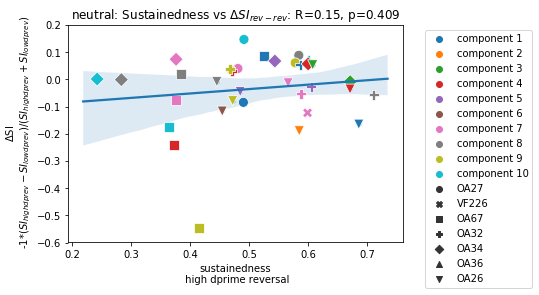

In [37]:
plt.figure()
dsus = ((sus_df['high_dp reversal1'] - sus_df['low_dp reversal1'])*-1)/(sus_df['high_dp reversal1'] + sus_df['low_dp reversal1'])
# dsusr = (norm_sus_df['high_dp learning'] - norm_sus_df['low_dp reversal1'])*-1
tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=sus_df.index)
sns.regplot(x=sus_df['high_dp reversal1'], y=tester['delta_sus'], marker='.')
sns.scatterplot(x=sus_df['high_dp reversal1'], y=tester['delta_sus'], s=100, hue=['component {}'.format(s) for s in sus_df.reset_index()['component'].values],
                style=sus_df.reset_index()['mouse'].values)
plt.legend(bbox_to_anchor=(1.05, 1))
# plt.ylim([-0.2, 0.2])
keep_bool = ~np.isnan(tester['delta_sus'])
r = sp.stats.pearsonr(sus_df['high_dp reversal1'].loc[keep_bool], tester['delta_sus'].loc[keep_bool])
plt.ylabel('$\Delta$SI\n -1*($SI_{high dp rev}-SI_{low dp rev})/(SI_{high dp rev}+SI_{low dp rev}$)')
plt.xlabel('sustainedness\n high dprime reversal')
plt.title('{}: '.format(ori) + 'Sustainedness vs $\Delta$$SI_{rev-rev}$' + ': R={}, p={}'.format(round(r[0], 2), round(r[1], 3)))
# plt.savefig('.//Sustainedness index plots//{}_{}_{}_SI_revhdp_v_revldp.pdf'.format(t_or_wa, ori, words[0]), bbox_inches='tight')

Text(0.5, 1.0, 'neutral: Sustainedness vs $\\Delta$$SI_{lrn-lrn}$: R=-0.46, p=0.0')

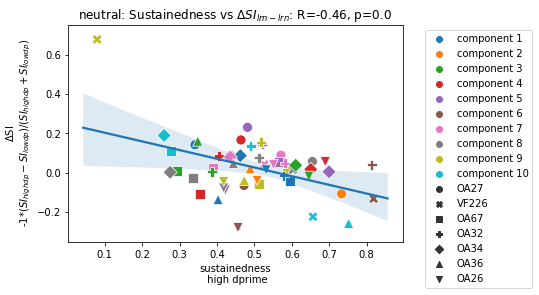

In [38]:
    plt.figure()
    dsus = ((sus_df['high_dp learning'] - sus_df['low_dp learning'])*-1)/(sus_df['high_dp learning'] + sus_df['low_dp learning'])
    # dsusr = (norm_sus_df['high_dp learning'] - norm_sus_df['low_dp reversal1'])*-1
    tester = pd.DataFrame(data=dsus.T, columns=['delta_sus'], index=sus_df.index)
    sns.regplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], marker='.')
    sns.scatterplot(x=sus_df['high_dp learning'], y=tester['delta_sus'], s=100,
                    hue=['component {}'.format(s) for s in sus_df.reset_index()['component'].values],
                    style=sus_df.reset_index()['mouse'].values)
    plt.legend(bbox_to_anchor=(1.05, 1))
    # plt.ylim([-0.2, 0.2])
    keep_bool = ~np.isnan(tester['delta_sus'])
    r = sp.stats.pearsonr(sus_df['high_dp learning'].loc[keep_bool], tester['delta_sus'].loc[keep_bool])
    plt.ylabel('$\Delta$SI\n -1*($SI_{high dp}-SI_{low dp})/(SI_{high dp}+SI_{low dp}$)')
    plt.xlabel('sustainedness\n high dprime')
    plt.title('{}: '.format(ori) + 'Sustainedness vs $\Delta$$SI_{lrn-lrn}$' + ': R={}, p={}'.format(round(r[0], 2), round(r[1], 3)))
#     plt.savefig('.//Sustainedness index plots//{}_{}_{}_SI_learnhdp_v_learnldp.pdf'.format(t_or_wa, ori, words[0]), bbox_inches='tight')

In [197]:
fac_list = []
mean_ten_list = []
for mi, V, meti, teni in zip(mice, model_list, meta_list, subset_tensor_list):
    A = _get_fitting_template_defaults(mi)
    fac_list.append(V.results[rank][0].factors[1])
    mean_ten_list.append(np.nanmean(teni, axis=2))

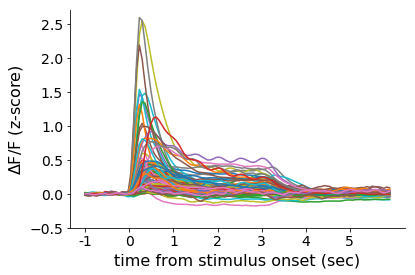

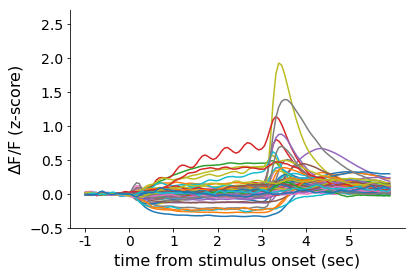

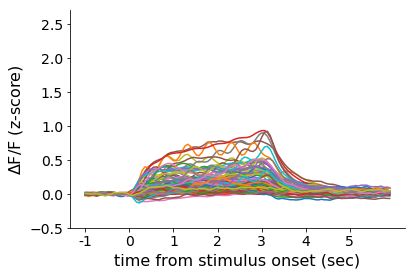

In [270]:
# g = sns.clustermap(mean_ten_list[0], col_cluster=False, method='ward')
off_cells = (np.argmax(mean_ten_list[0], axis=1)>65) & (np.max(mean_ten_list[0], axis=1)>.1)
offset = mean_ten_list[0][off_cells, :]
ons_cells = (np.argmax(mean_ten_list[0], axis=1)<27) & (np.argmax(mean_ten_list[0], axis=1)>18)
onset = mean_ten_list[0][ons_cells, :]
sus_cells = (np.argmax(mean_ten_list[0], axis=1)<65) & (np.argmax(mean_ten_list[0], axis=1)>27)
sust = mean_ten_list[0][sus_cells, :]

# plt.plot(mean_ten_list[0][:, :].T)
plt.figure()
plt.plot(onset.T)
sns.despine()
plt.ylim([-0.5, 2.7])
plt.ylabel('$\Delta$F/F (z-score)', size=16)
plt.xticks(timepts, labels=times, size=14)
plt.yticks(size=14)
plt.xlabel('time from stimulus onset (sec)', size=16)
plt.savefig('.//Raw for slides//christina-horrible_cells_onset.pdf', bbox_inches='tight')

plt.figure()
plt.plot(offset.T)
sns.despine()
plt.ylim([-0.5, 2.7])
plt.ylabel('$\Delta$F/F (z-score)', size=16)
plt.xticks(timepts, labels=times, size=14)
plt.yticks(size=14)
plt.xlabel('time from stimulus onset (sec)', size=16)
plt.savefig('.//Raw for slides//christina-horrible_cells_offset.pdf', bbox_inches='tight')

plt.figure()
plt.plot(sust.T)
sns.despine()
plt.ylim([-0.5, 2.7])
plt.ylabel('$\Delta$F/F (z-score)', size=16)
plt.xticks(timepts, labels=times, size=14)
plt.yticks(size=14)
plt.xlabel('time from stimulus onset (sec)', size=16)
plt.savefig('.//Raw for slides//christina-horrible_cells_sustained.pdf', bbox_inches='tight')

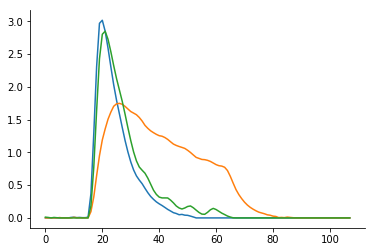

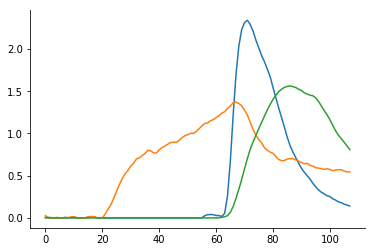

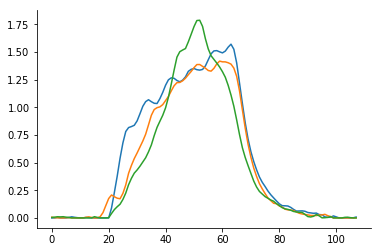

In [227]:
# g = sns.clustermap(mean_ten_list[0], col_cluster=False, method='ward')
off_cells = (np.argmax(fac_list[0], axis=0)>65) & (np.max(fac_list[0], axis=0)>.0)
offset = fac_list[0][:, off_cells]
ons_cells = (np.argmax(fac_list[0], axis=0)<27) & (np.argmax(fac_list[0], axis=0)>18)
onset = fac_list[0][:, ons_cells]
sus_cells = (np.argmax(fac_list[0], axis=0)<65) & (np.argmax(fac_list[0], axis=0)>27)
sust = fac_list[0][:, sus_cells]

# plt.plot(mean_ten_list[0][:, :].T)
plt.figure()
plt.plot(onset)
sns.despine()
# plt.savefig('.//Raw for slides//OA27_comps_christina-horrible_cells_onset.eps', bbox_inches='tight')
plt.figure()
plt.plot(offset)
sns.despine()
# plt.savefig('.//Raw for slides//OA27_comps_christina-horrible_cells_offset.eps', bbox_inches='tight')
plt.figure()
plt.plot(sust)
sns.despine()
# plt.savefig('.//Raw for slides//OA27_comps_christina-horrible_cells_sustained.eps', bbox_inches='tight')

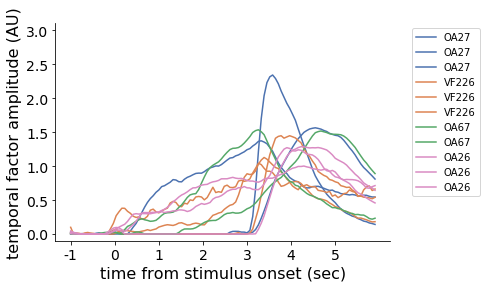

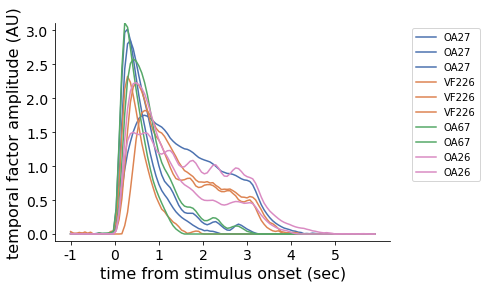

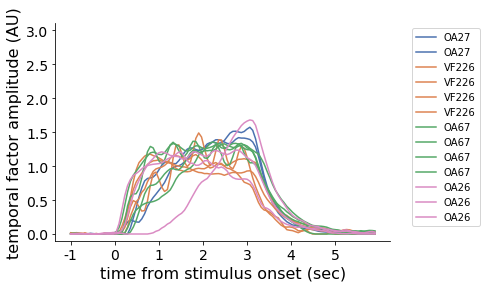

In [272]:
times = np.arange(-1, 7, 1)
timepts = np.arange(0, 108, 15.5)

# plt.plot(mean_ten_list[0][:, :].T)
plt.figure()
for faci, mi in zip(fac_list, mice):
    if mi in ['OA32', 'OA34', 'OA36']:
        continue
    off_cells = (np.argmax(faci, axis=0)>65) & (np.max(faci, axis=0)>0)
    offset = faci[:, off_cells]
    plt.plot(offset, color=hue_dict[mi], label=mi)
sns.despine()
plt.ylim([-0.1, 3.1])
plt.ylabel('temporal factor amplitude (AU)', size=16)
plt.xticks(timepts, labels=times, size=14)
plt.yticks(size=14)
plt.xlabel('time from stimulus onset (sec)', size=16)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig('.//Raw for slides//3smice_comps_christina-horrible_cells_offset.pdf', bbox_inches='tight')

plt.figure()
for faci, mi in zip(fac_list, mice):
    if mi in ['OA32', 'OA34', 'OA36']:
        continue
    ons_cells = (np.argmax(faci, axis=0)<27) & (np.argmax(faci, axis=0)>18)
    onset = faci[:, ons_cells]
    plt.plot(onset, color=hue_dict[mi], label=mi)
sns.despine()
plt.ylim([-0.1, 3.1])
plt.ylabel('temporal factor amplitude (AU)', size=16)
plt.xticks(timepts, labels=times, size=14)
plt.yticks(size=14)
plt.xlabel('time from stimulus onset (sec)', size=16)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig('.//Raw for slides//3smice_comps_christina-horrible_cells_onset.pdf', bbox_inches='tight')

plt.figure()
for faci, mi in zip(fac_list, mice):
    if mi in ['OA32', 'OA34', 'OA36']:
        continue
    sus_cells = (np.argmax(faci, axis=0)<65) & (np.argmax(faci, axis=0)>27) & (np.max(faci, axis=0)<1.76)
    sust = faci[:, sus_cells]
    plt.plot(sust, color=hue_dict[mi], label=mi)
sns.despine()
plt.ylim([-0.1, 3.1])
plt.ylabel('temporal factor amplitude (AU)', size=16)
plt.xticks(timepts, labels=times, size=14)
plt.yticks(size=14)
plt.xlabel('time from stimulus onset (sec)', size=16)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig('.//Raw for slides//3smice_comps_christina-horrible_cells_sustained.pdf', bbox_inches='tight')

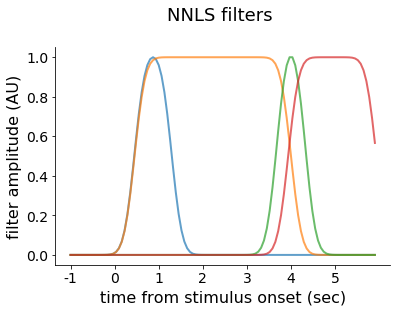

In [262]:
A = _get_fitting_template_defaults('OA27')
plt.plot(A, linewidth=2, alpha=0.7)
plt.title('NNLS filters \n', size=18)
plt.xticks(timepts, labels=times,  size=14)
plt.yticks(size=14)
plt.ylabel('filter amplitude (AU)', size=16)
plt.xlabel('time from stimulus onset (sec)', size=16)
sns.despine()
plt.savefig('.//Raw for slides//NNLS_filters.eps', bbox_inches='tight')